# CNN-RNN Model Training, Dependent Labels
## Author: Ian Scarff (iie728)

In [1]:
import pandas as pd
import numpy as np
import json
import os
import imageio
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.preprocessing import MultiLabelBinarizer
import time
import datetime

import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torchvision
import torch.nn.functional as F
from torchvision import transforms
from torchvision import models
from torch.utils.data import DataLoader, SubsetRandomSampler
from sklearn.model_selection import KFold
import skimage

from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

import warnings
warnings.filterwarnings('ignore')

## Setup

In [2]:
classes = ['Smears', 'Loaded Language', 'Name calling/Labeling', 'Glittering generalities (Virtue)',
               'Appeal to (Strong) Emotions', 'Appeal to fear/prejudice', 'Transfer', 'Doubt',
               'Exaggeration/Minimisation', 'Whataboutism', 'Slogans', 'Flag-waving',
               "Misrepresentation of Someone's Position (Straw Man)", 'Causal Oversimplification',
               'Thought-terminating cliché', 'Black-and-white Fallacy/Dictatorship', 'Appeal to authority',
               'Reductio ad hitlerum', 'Repetition', 'Obfuscation, Intentional vagueness, Confusion',
               'Presenting Irrelevant Data (Red Herring)', 'Bandwagon']

### Create Class Binarizer
one_hot = MultiLabelBinarizer()
one_hot.fit([classes])

MultiLabelBinarizer()

In [3]:
from CustomLoader import ImageLoader

In [4]:
training_data = ImageLoader(json_file = 'training_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

testing_data = ImageLoader(json_file = 'testing_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

In [5]:
train_loader = DataLoader(dataset = training_data, batch_size = 25, shuffle = True)
test_loader = DataLoader(dataset = testing_data, batch_size = 25, shuffle = True)

# 
# 

## Define CNN-RNN Architectures (Set Hidden Size)

In [6]:
class Identity(nn.Module):
    def forward(self, x):
        return x

### ResNet18-LSTM

In [7]:
### Define Class
class ResNet18_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet18_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet18 = models.resnet18(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet18.fc.in_features
        
        resnet18.fc = Identity()
        
        for param in resnet18.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = resnet18
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)       
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet50-LSTM

In [8]:
### Define Class
class ResNet50_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet50_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet50 = models.resnet50(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet50.fc.in_features
        
        resnet50.fc = Identity()
        
        for param in resnet50.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = resnet50
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)       
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet101-LSTM

In [9]:
### Define Class
class ResNet101_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet101_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet101 = models.resnet101(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet101.fc.in_features
        
        resnet101.fc = Identity()
        
        for param in resnet101.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = resnet101
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet121-LSTM

In [10]:
### Define Class
class DenseNet121_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet121_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet121 = models.densenet121(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = densenet121.classifier.in_features
        
        densenet121.classifier = Identity()
        
        for param in densenet121.parameters():
            param.requires_grad = False

        ### CNN Encoder
        self.cnn = densenet121
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
       
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet169-LSTM

In [11]:
### Define Class
class DenseNet169_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet169_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet169 = models.densenet169(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = densenet169.classifier.in_features
        
        densenet169.classifier = Identity()
        
        for param in densenet169.parameters():
            param.requires_grad = False

        ### CNN Encoder
        self.cnn = densenet169
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
           
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet201-LSTM

In [12]:
### Define Class
class DenseNet201_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet201_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
               
        
        ### Import DenseNet101
        densenet201 = models.densenet201(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = densenet201.classifier.in_features
        
        densenet201.classifier = Identity()
        
        for param in densenet201.parameters():
            param.requires_grad = False

        ### CNN Encoder
        self.cnn = densenet201
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG11_BN-LSTM

In [13]:
### Define Class
class VGG11_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG11_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg11bn = models.vgg11_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg11bn.classifier[6].in_features
        
        vgg11bn.classifier[6] = Identity()
        
        
        for param in vgg11bn.parameters():
            param.requires_grad = False

            
            
        ### CNN Encoder
        self.cnn = vgg11bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG16_BN-LSTM

In [14]:
### Define Class
class VGG16_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG16_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg16bn = models.vgg16_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg16bn.classifier[6].in_features
        
        vgg16bn.classifier[6] = Identity()
        
        for param in vgg16bn.parameters():
            param.requires_grad = False

            
            
        ### CNN Encoder
        self.cnn = vgg16bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG19_BN-LSTM

In [15]:
### Define Class
class VGG19_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG19_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg19bn = models.vgg19_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg19bn.classifier[6].in_features
        
        vgg19bn.classifier[6] = Identity()
        
        
        for param in vgg19bn.parameters():
            param.requires_grad = False

            
            
        ### CNN Encoder
        self.cnn = vgg19bn
        
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

# 
# 
# 

## Define Training Methodology

In [16]:
def get_lr(optim):
    for param_group in optim.param_groups:
        return param_group['lr']

In [17]:
### This function is used to train a cnn model
def Kfold_train_CNN_RNN(model = None, training_data = None, learning_rate = None, k_folds = None, n_epochs = None, model_name = None):
    
    ### Check that all entries are valid
    if ((model == None) or (training_data == None) or (model_name == None) or 
        (learning_rate == None) or (k_folds == None) or (n_epochs == None)):
        print ('Enter all info.')
        
        
        
    ### Run K-Fold CV
    else:
        
        device = 'cpu'

        ### Set Loss Function and Optimizer
        criterion = nn.BCELoss()
        
        
        #### Define the K-fold Cross Validator
        kfold = KFold(n_splits=k_folds, shuffle=True)
        
        
        
        ### Create values to hold the best model metrics across folds
        val_f1_mic_max = 0 ### This determines best model
        
        best_train_loss = 0
        best_train_acc = 0
        best_train_f1_mic = 0
        best_train_f1_mac = 0
        best_train_prec_mic = 0
        best_train_prec_mac = 0
        best_train_rec_mic = 0
        best_train_rec_mac = 0

        best_val_acc = 0
        best_val_loss = 0
#         best_val_f1_mic = 0
        best_val_f1_mac = 0
        best_val_prec_mic = 0
        best_val_prec_mac = 0
        best_val_rec_mic = 0
        best_val_rec_mac = 0
        
        best_fold = 0
        best_epoch = 0
        

        
        ### Start print

        start = time.time()
        
        ### K-fold Cross Validation model evaluation
        for fold, (train_ids, val_ids) in enumerate(kfold.split(training_data)):
            
            print('-------------------------------------------')
            print('FOLD {}'.format(fold + 1))
            print('-------------------------------------------')
            
            ### Sample elements randomly from a given list of ids, no replacement
            train_subsampler = SubsetRandomSampler(train_ids)
            val_subsampler = SubsetRandomSampler(val_ids)
            
            ### Define data loaders for training and validation in current fold
            train_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = train_subsampler)
            val_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = val_subsampler)
            
            ### Initialize network
            network = model
            if torch.cuda.is_available():
                network.cuda()
                network = nn.DataParallel(network, list(range(2)))
                device = 'cuda'
            
            ### Initialize optimizer
            optimizer = optim.Adam(model.parameters(), lr=learning_rate)
            scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.1, patience = 5)
            
            
            ### Create lists of values at the end of each epoch for each fold
            train_loss = []
            train_acc = []
            train_f1_mic = []
            train_f1_mac = []
            train_prec_mic = []
            train_prec_mac = []
            train_rec_mic = []
            train_rec_mac = []
            
            val_loss = []
            val_acc = []
            val_f1_mic = []
            val_f1_mac = []
            val_prec_mic = []
            val_prec_mac = []
            val_rec_mic = []
            val_rec_mac = []
            
            
            ### Train network
            for epoch in range(n_epochs):
                
                ### Hold training predictions and targets
                train_output = np.empty((0,22), int)
                train_all_targets = np.empty((0,22), int)
                
                val_output = np.empty((0,22), int)
                val_all_targets = np.empty((0,22), int)
                
                
                ### Train ###
                network.train()
                
                train_running_loss = 0.0
                
                batch_number = 0
                for i, data in enumerate(train_loader):
                    
                    images, targets = data[0].to(device), data[1].float().to(device)
                    optimizer.zero_grad()
                    
                    output = network(images)
                    
                    loss = criterion(output, targets) 
                    train_running_loss += loss.item()
                                        
                    ### Append output
                    train_output = np.vstack((train_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    train_all_targets = np.vstack((train_all_targets, targets.cpu().numpy().astype('int')))

                    loss.backward()
                    optimizer.step()
                                        
                    
                ### Calculate metrics and append
                train_loss.append(train_running_loss/len(train_loader.dataset))
                train_acc.append(accuracy_score(train_all_targets, train_output))
                train_f1_mic.append(f1_score(train_all_targets, train_output, average = 'micro'))
                train_f1_mac.append(f1_score(train_all_targets, train_output, average = 'macro'))
                train_prec_mic.append(precision_score(train_all_targets, train_output, average = 'micro'))
                train_prec_mac.append(precision_score(train_all_targets, train_output, average = 'macro'))
                train_rec_mic.append(recall_score(train_all_targets, train_output, average = 'micro'))
                train_rec_mac.append(recall_score(train_all_targets, train_output, average = 'macro'))
                
                
                ### Validate###
                network.eval()
                val_running_loss = 0.0

                                
                for i, data in enumerate(val_loader):
                    images, targets = data[0].to(device), data[1].float().to(device)
                    output = network(images)
                    loss = criterion(output, targets)
                    val_running_loss += loss.item()
                    
                    ### Append output
                    val_output = np.vstack((val_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    val_all_targets = np.vstack((val_all_targets, targets.cpu().numpy().astype('int')))

                
                ### Calculate metrics and append
                val_loss.append(val_running_loss/len(val_loader.dataset))
                val_acc.append(accuracy_score(val_all_targets, val_output))
                val_f1_mic.append(f1_score(val_all_targets, val_output, average = 'micro'))
                val_f1_mac.append(f1_score(val_all_targets, val_output, average = 'macro'))
                val_prec_mic.append(precision_score(val_all_targets, val_output, average = 'micro'))
                val_prec_mac.append(precision_score(val_all_targets, val_output, average = 'macro'))
                val_rec_mic.append(recall_score(val_all_targets, val_output, average = 'micro'))
                val_rec_mac.append(recall_score(val_all_targets, val_output, average = 'macro'))
                
                
                ### Save model with the lowest validation loss
                if val_f1_mic[epoch] > val_f1_mic_max:
                    print('Validation F1 Micro Score Increased ({:.6f} --> {:.6f}).  Saving model ...\n'.format(
                    val_f1_mic_max,
                    val_f1_mic[epoch]))
                    torch.save(network.state_dict(), 'BestCnnRnnModels_10folds/' + model_name +'.pt')
                    val_f1_mic_max = val_f1_mic[epoch]
                    
                    ### Set current best metrics
                    best_train_loss = train_loss[epoch]
                    best_train_acc = train_acc[epoch]
                    best_train_f1_mic = train_f1_mic[epoch]
                    best_train_f1_mac = train_f1_mac[epoch]
                    best_train_prec_mic = train_prec_mic[epoch]
                    best_train_prec_mac = train_prec_mac[epoch]
                    best_train_rec_mic = train_rec_mic[epoch]
                    best_train_rec_mac = train_rec_mac[epoch]

                    best_val_acc = val_acc[epoch]
                    best_val_loss = val_loss[epoch]
#                     best_val_f1_mic = val_f1_mic[epoch]
                    best_val_f1_mac = val_f1_mac[epoch]
                    best_val_prec_mic = val_prec_mic[epoch]
                    best_val_prec_mac = val_prec_mac[epoch]
                    best_val_rec_mic = val_rec_mic[epoch]
                    best_val_rec_mac = val_rec_mac[epoch]

                    best_fold = fold + 1
                    best_epoch = epoch + 1
                    
                    
                    
                ### Display summary for epoch
                print('Epoch {} \tLearning Rate: {} \tTime (min): {}'.format(epoch+1, get_lr(optimizer), round((time.time()-start)/60, 2)))
                print('Train Loss: {} \tValidation Loss: {}'. format(round(train_loss[epoch], 4),
                                                                     round(val_loss[epoch], 4)))
                print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(train_acc[epoch], 4),
                                                                            round(val_acc[epoch], 4)))
                print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(train_f1_mic[epoch], 4),
                                                                            round(val_f1_mic[epoch], 4)))
                print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(train_f1_mac[epoch], 4),
                                                                            round(val_f1_mac[epoch], 4)))
                print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(train_prec_mic[epoch], 4),
                                                                                          round(val_prec_mic[epoch], 4)))
                print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(train_prec_mac[epoch], 4),
                                                                                          round(val_prec_mac[epoch], 4)))
                print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(train_rec_mic[epoch], 4),
                                                                                    round(val_rec_mic[epoch], 4)))
                print('Train Recall Marco: {} \tValidation Recall Macro: {}\n'.format(round(train_rec_mac[epoch], 4),
                                                                                    round(val_rec_mac[epoch], 4)))
                
                
                ### Update learning rate if needed
                scheduler.step(val_loss[epoch])
                
                
                
            ### Display summary graph of fold
            fig, (ax1, ax3) = plt.subplots(1,2, figsize = (20,6))
            ax1.set_xlabel('Epoch')
            ax1.set_ylabel('Loss')
            ln1 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), train_loss, label = 'Train Loss')
            ln2 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), val_loss, label = 'Val Loss')
            
            ax2 = ax1.twinx()
            ax2.set_ylabel('Accuracy')
            ln3 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), train_acc, marker = 'o', label = 'Train Acc')
            ln4 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), val_acc, marker = 'o', label = 'Val Acc')
            
            lns1 = ln1 + ln2 + ln3 + ln4
            labs1 = [l.get_label() for l in lns1]
            
            ax3.set_xlabel('Epoch')
            ax3.set_ylabel('Score')
            ln5 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mic, marker = 'v', label = 'Train F1 Micro')
            ln6 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mic, marker = 'v', label = 'Val F1 Micro')
            ln7 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mac, marker = '^', label = 'Train F1 Macro')
            ln8 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mac, marker = '^', label = 'Val F1 Micro')
            ln9 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mic, marker = 'd', label = 'Train Prec. Micro')
            ln10 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mic, marker = 'd', label = 'Val Prec. Micro')
            ln11 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mac, marker = 'X', label = 'Train Prec. Macro')
            ln12 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mac, marker = 'X', label = 'Val Prec. Macro')
            ln13 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mic, marker = 'P', label = 'Train Rec. Micro')
            ln14 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mic, marker = 'P', label = 'Val Rec. Micro')
            ln15 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mac, marker = 's', label = 'Train Rec. Macro')
            ln16 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mac, marker = 's', label = 'Val Rec. Macro')
            
            lns2 = ln5 + ln6 + ln7 + ln8 +  ln9 + ln10 + ln11 + ln12 + ln13 + ln14 + ln15 + ln16
            labs2 = [l.get_label() for l in lns2]
            
            
            ax1.legend(lns1, labs1, loc = 'upper left', bbox_to_anchor = (1.1,1))
            ax3.legend(lns2, labs2, loc = 'upper left', bbox_to_anchor = (1.05,1))
            fig.tight_layout()
            
            plt.show()
        
        
        
        ### Display metrics of the best model
                
        print('------------------------------------------------------------')
        print('------------------------------------------------------------')
        
        print('\nMetrics of Best Model:')
        print('Fold: {} \tEpoch: {}'.format(best_fold, best_epoch))
        print('Train Loss: {} \tValidation Loss: {}'. format(round(best_train_loss, 4),
                                                             round(best_val_loss, 4)))
        print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(best_train_acc, 4),
                                                                    round(best_val_acc, 4)))
        print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(best_train_f1_mic, 4),
                                                                    round(val_f1_mic_max, 4)))
        print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(best_train_f1_mac, 4),
                                                                    round(best_val_f1_mac, 4)))
        print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(best_train_prec_mic, 4),
                                                                                  round(best_val_prec_mic, 4)))
        print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(best_train_prec_mac, 4),
                                                                                  round(best_val_prec_mac, 4)))
        print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(best_train_rec_mic, 4),
                                                                            round(best_val_rec_mic, 4)))
        print('Train Recall Marco: {} \tValidation Recall Macro: {}'.format(round(best_train_rec_mac, 4),
                                                                            round(best_val_rec_mac, 4)))
        
        
        ### Return best metrics
        return [best_fold, best_epoch, best_train_loss, best_train_acc, best_train_f1_mic, best_train_f1_mac, best_train_prec_mic, best_train_prec_mac, best_train_rec_mic, best_train_rec_mac,
                best_val_loss, best_val_acc, val_f1_mic_max, best_val_f1_mac, best_val_prec_mic, best_val_prec_mac, best_val_rec_mic, best_val_rec_mac]
  

# 
# 

## Initialize Models: Hidden Size = 500, Number of Layers = 1, Dropout = 50%

In [18]:
resnet18LSTM_500_1_50 = ResNet18_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)
resnet50LSTM_500_1_50 = ResNet50_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)
resnet101LSTM_500_1_50 = ResNet101_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)

densenet121LSTM_500_1_50 = DenseNet121_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)
densenet169LSTM_500_1_50 = DenseNet169_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)
densenet201LSTM_500_1_50 = DenseNet201_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)

vgg11bnLSTM_500_1_50 = VGG11_BN_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)
vgg16bnLSTM_500_1_50 = VGG16_BN_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)
vgg19bnLSTM_500_1_50 = VGG19_BN_LSTM(hiddenSize = 500, numLayers = 1, dpout = 0.5)

## Train Models

In [19]:
START = time.time()

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.17
Train Loss: 0.0173 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.055 	Validation F1 Micro: 0.0
Train F1 Marco: 0.047 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.118 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1169 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0359 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0493 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.29
Train Loss: 0.0128 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Vali

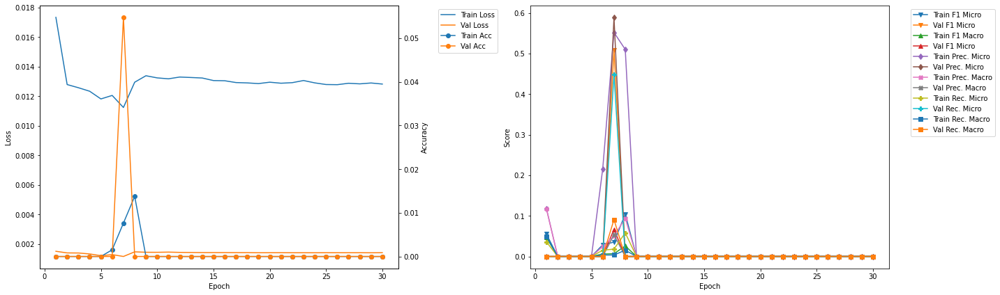

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 3.95
Train Loss: 0.0133 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.07
Train Loss: 0.0131 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

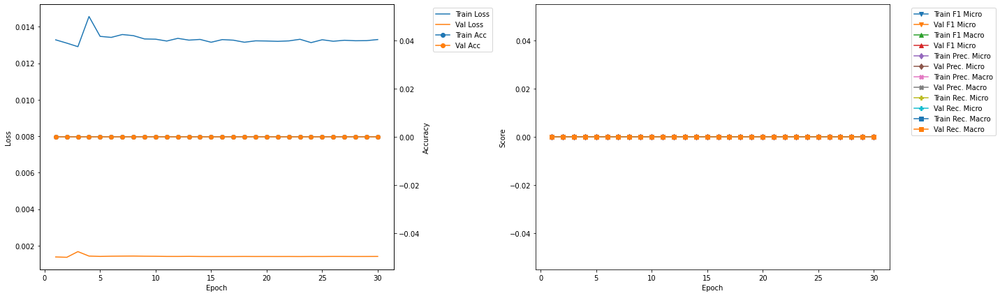

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 7.71
Train Loss: 0.0136 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 7.83
Train Loss: 0.0132 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

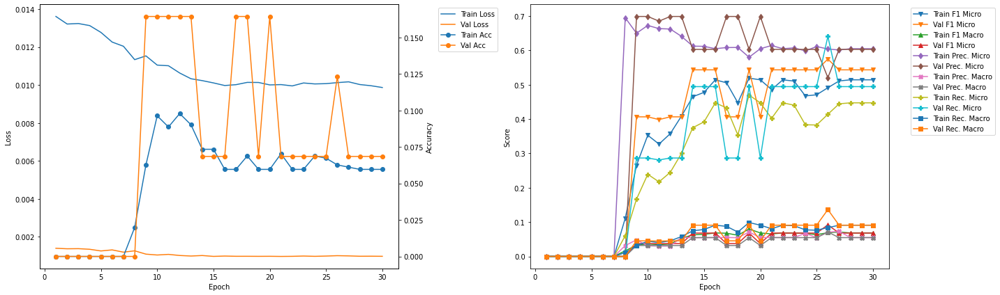

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.48
Train Loss: 0.0136 	Validation Loss: 0.0014
Train Accuracy: 0.0061 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1011 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0246 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.32 	Validation Precision Micro: 0.0
Train Precision Marco: 0.063 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.06 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0189 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.6
Train Loss: 0.0111 	Validation Loss: 0.0013
Train Accuracy: 0.0581 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.2153 	Validation F1 Micro: 0.3345
Train F1 Marco: 0.0263 	Validation F1 Macro: 0.0361
Train Precision Mirco: 0.6748 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0307 	Validation Precision Macro: 0.0299
Train Recall Mirco: 0.1281 	Validation Recall Micro

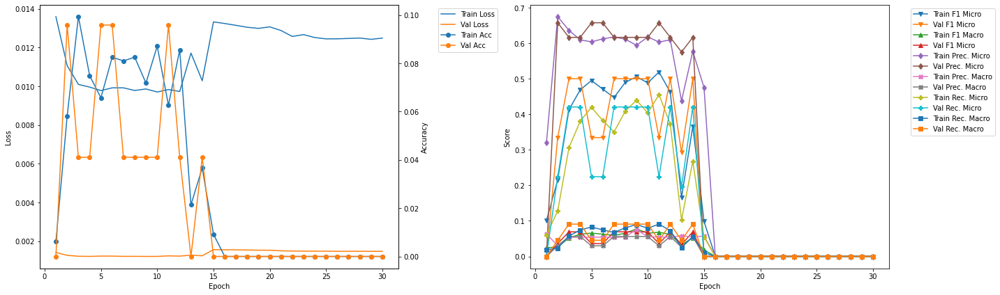

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 15.24
Train Loss: 0.0137 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.37
Train Loss: 0.0134 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall

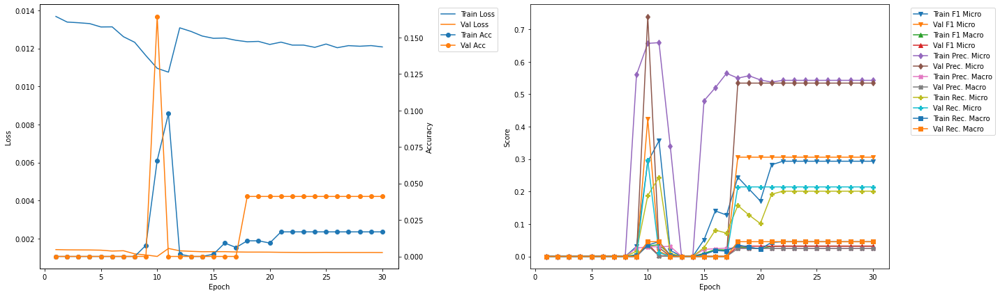

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.0
Train Loss: 0.0127 	Validation Loss: 0.0014
Train Accuracy: 0.0046 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.0937 	Validation F1 Micro: 0.2812
Train F1 Marco: 0.0154 	Validation F1 Macro: 0.03
Train Precision Mirco: 0.5084 	Validation Precision Micro: 0.4932
Train Precision Marco: 0.0231 	Validation Precision Macro: 0.0224
Train Recall Mirco: 0.0516 	Validation Recall Micro: 0.1967
Train Recall Marco: 0.0116 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.13
Train Loss: 0.0118 	Validation Loss: 0.0013
Train Accuracy: 0.0122 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1807 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0245 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5457 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0248 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1083 	Validation Rec

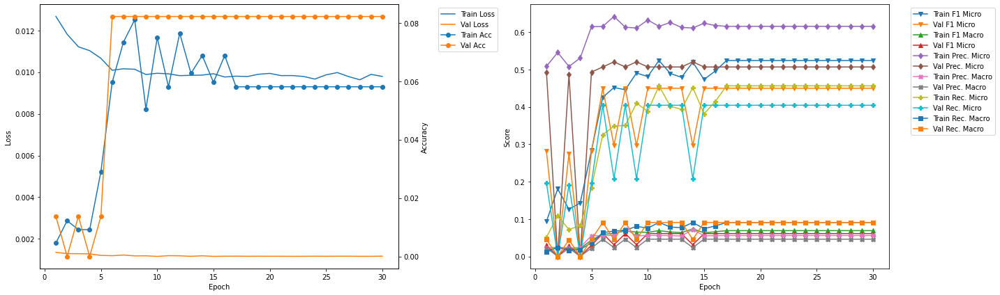

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.77
Train Loss: 0.0111 	Validation Loss: 0.0013
Train Accuracy: 0.0443 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.3277 	Validation F1 Micro: 0.4615
Train F1 Marco: 0.0491 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.6114 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0559 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.2238 	Validation Recall Micro: 0.3853
Train Recall Marco: 0.0443 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 22.89
Train Loss: 0.0099 	Validation Loss: 0.0013
Train Accuracy: 0.0749 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4668 	Validation F1 Micro: 0.2818
Train F1 Marco: 0.0707 	Validation F1 Macro: 0.0327
Train Precision Mirco: 0.5896 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0705 	Validation Precision Macro: 0.0255
Train Recall Mirco: 0.38

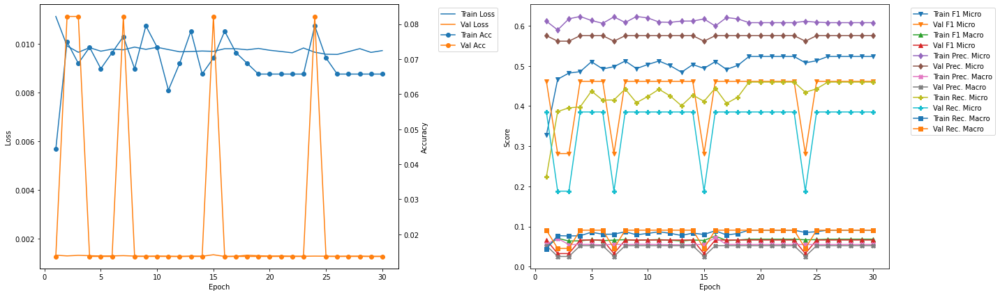

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.53
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0809 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4409 	Validation F1 Micro: 0.5029
Train F1 Marco: 0.0622 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6102 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0692 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.3452 	Validation Recall Micro: 0.4272
Train Recall Marco: 0.0678 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.66
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0901 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4798 	Validation F1 Micro: 0.5029
Train F1 Marco: 0.0644 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6249 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0558 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.3894

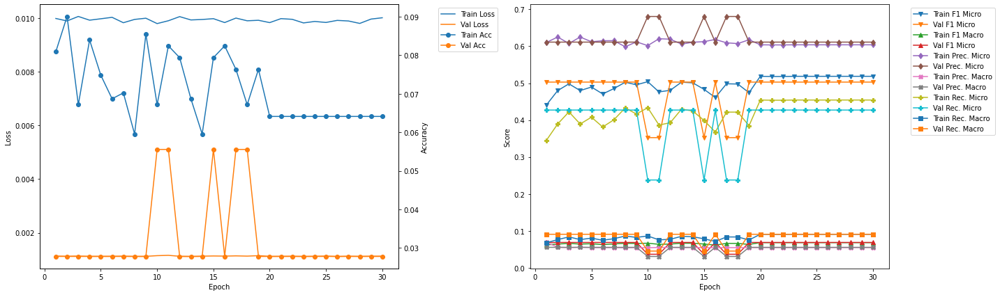

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.3
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0748 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4887 	Validation F1 Micro: 0.4756
Train F1 Marco: 0.0652 	Validation F1 Macro: 0.0662
Train Precision Mirco: 0.6194 	Validation Precision Micro: 0.5764
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0524
Train Recall Mirco: 0.4036 	Validation Recall Micro: 0.4049
Train Recall Marco: 0.0791 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.42
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0595 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5002 	Validation F1 Micro: 0.3394
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.0359
Train Precision Mirco: 0.6116 	Validation Precision Micro: 0.6528
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0297
Train Recall Mirco: 0.423

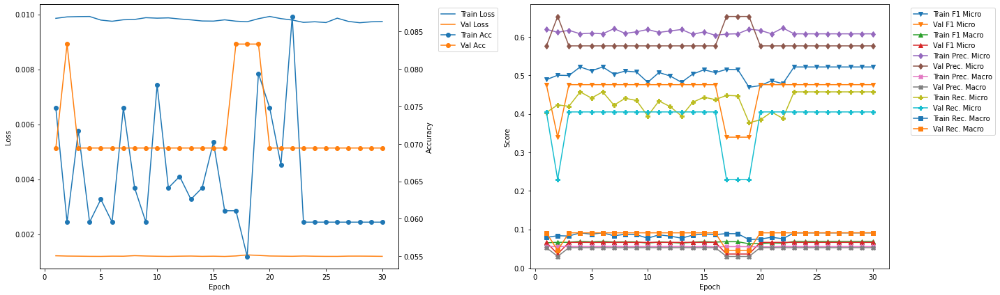

-------------------------------------------
FOLD 10
-------------------------------------------
Validation F1 Micro Score Increased (0.574307 --> 0.577640).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 34.06
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0733 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4725 	Validation F1 Micro: 0.5776
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0712
Train Precision Mirco: 0.6145 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0769 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.3838 	Validation Recall Micro: 0.5225
Train Recall Marco: 0.0777 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.19
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0595 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.496 	Validation F1 Micro: 0.5776
Train F1 Marco: 0.0666 	Validation F1 Macro: 0.0712
Train Precision Mirco: 0.6032 	Validation Precision Micro: 0.6458
Train Precis

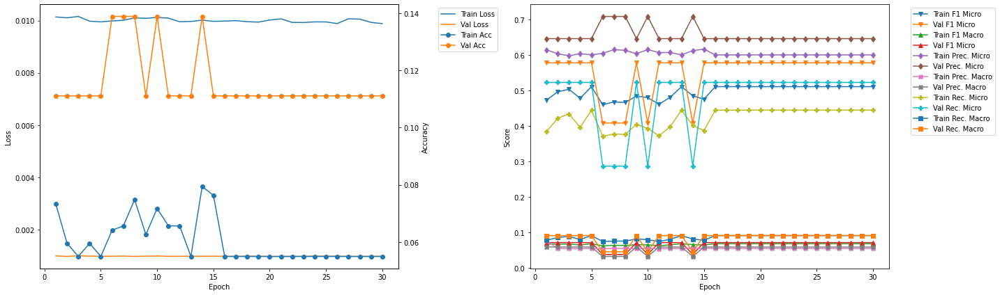

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 10 	Epoch: 1
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0733 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4725 	Validation F1 Micro: 0.5776
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0712
Train Precision Mirco: 0.6145 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0769 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.3838 	Validation Recall Micro: 0.5225
Train Recall Marco: 0.0777 	Validation Recall Macro: 0.0909


In [20]:
resnet18LSTM_500_1_50_best = Kfold_train_CNN_RNN(model = resnet18LSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet18LSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.14
Train Loss: 0.0166 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0682 	Validation F1 Micro: 0.0
Train F1 Marco: 0.057 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1423 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1422 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0449 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0558 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.28
Train Loss: 0.0125 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

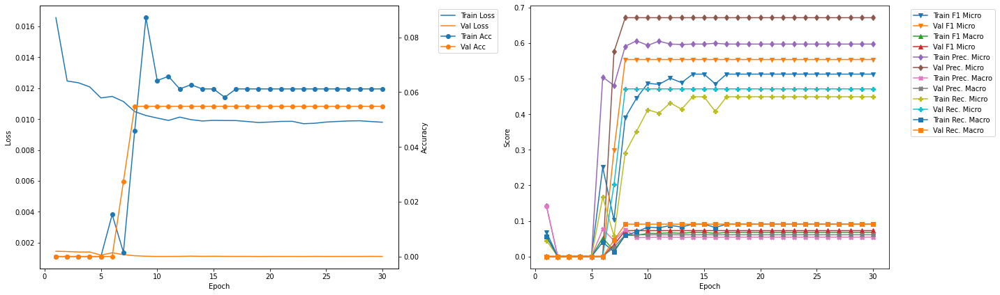

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.38
Train Loss: 0.0115 	Validation Loss: 0.0013
Train Accuracy: 0.0474 	Validation Accuracy: 0.0
Train F1 Mirco: 0.4157 	Validation F1 Micro: 0.2403
Train F1 Marco: 0.0702 	Validation F1 Macro: 0.0271
Train Precision Mirco: 0.559 	Validation Precision Micro: 0.4247
Train Precision Marco: 0.0739 	Validation Precision Macro: 0.0193
Train Recall Mirco: 0.3309 	Validation Recall Micro: 0.1676
Train Recall Marco: 0.0699 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.52
Train Loss: 0.011 	Validation Loss: 0.0012
Train Accuracy: 0.0505 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.3454 	Validation F1 Micro: 0.4653
Train F1 Marco: 0.0533 	Validation F1 Macro: 0.0622
Train Precision Mirco: 0.608 	Validation Precision Micro: 0.5274
Train Precision Marco: 0.0594 	Validation Precision Macro: 0.0479
Train Recall Mirco: 0.2412 	Vali

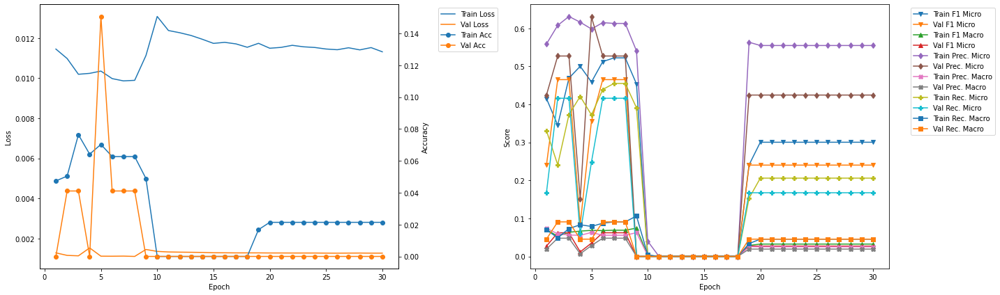

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 8.61
Train Loss: 0.0122 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0391 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0107 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.36 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0355 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0207 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0067 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.75
Train Loss: 0.0117 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

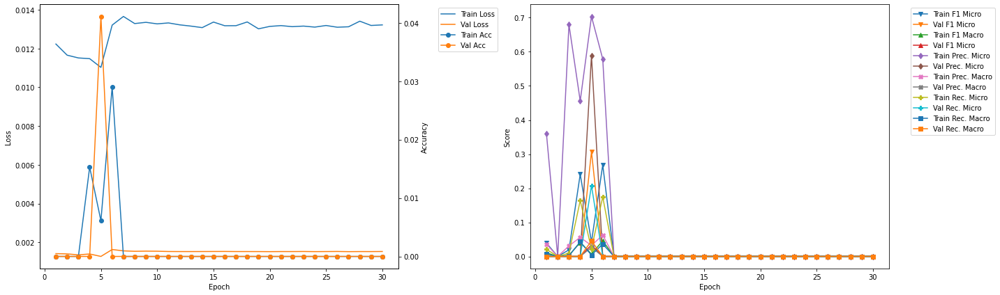

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.84
Train Loss: 0.0134 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.98
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall

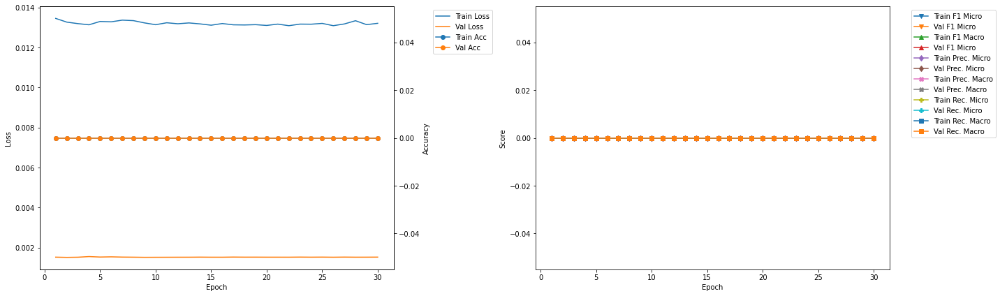

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.07
Train Loss: 0.0135 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.21
Train Loss: 0.0132 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall

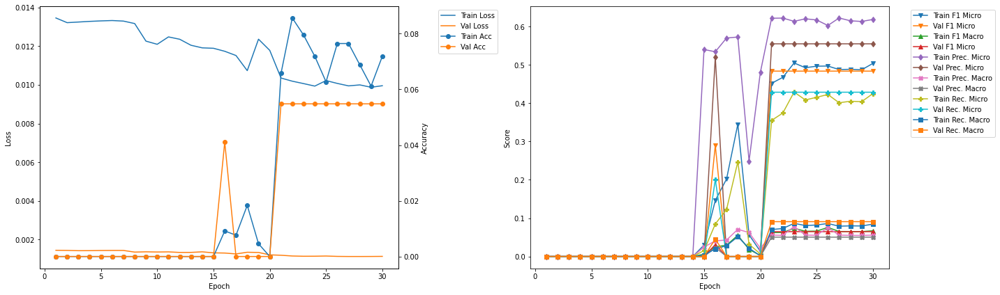

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.3
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0765 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4733 	Validation F1 Micro: 0.5138
Train F1 Marco: 0.0634 	Validation F1 Macro: 0.0702
Train Precision Mirco: 0.615 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.3847 	Validation Recall Micro: 0.4306
Train Recall Marco: 0.0756 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.44
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5 	Validation F1 Micro: 0.5138
Train F1 Marco: 0.0663 	Validation F1 Macro: 0.0702
Train Precision Mirco: 0.601 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.4281 	Valida

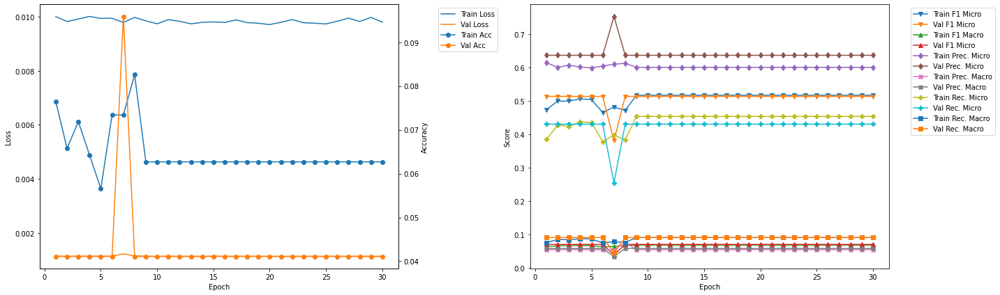

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.52
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.467 	Validation F1 Micro: 0.5196
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.5979 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0687 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.3831 	Validation Recall Micro: 0.4649
Train Recall Marco: 0.077 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.66
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4889 	Validation F1 Micro: 0.3643
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.6098 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0293
Train Recall Mirco: 0.4081 	V

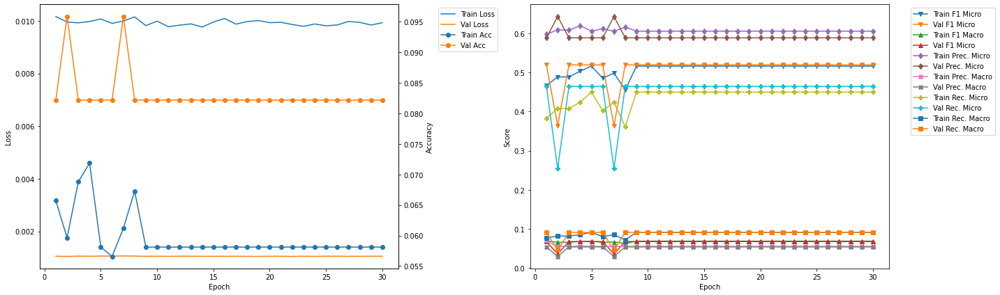

-------------------------------------------
FOLD 8
-------------------------------------------
Validation F1 Micro Score Increased (0.553672 --> 0.575000).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 29.75
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0595 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.479 	Validation F1 Micro: 0.575
Train F1 Marco: 0.0646 	Validation F1 Macro: 0.0706
Train Precision Mirco: 0.6052 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0581
Train Recall Mirco: 0.3964 	Validation Recall Micro: 0.5227
Train Recall Marco: 0.08 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 29.89
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0779 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.4824 	Validation F1 Micro: 0.4194
Train F1 Marco: 0.0652 	Validation F1 Macro: 0.0381
Train Precision Mirco: 0.6095 	Validation Precision Micro: 0.7222
Train Precision Ma

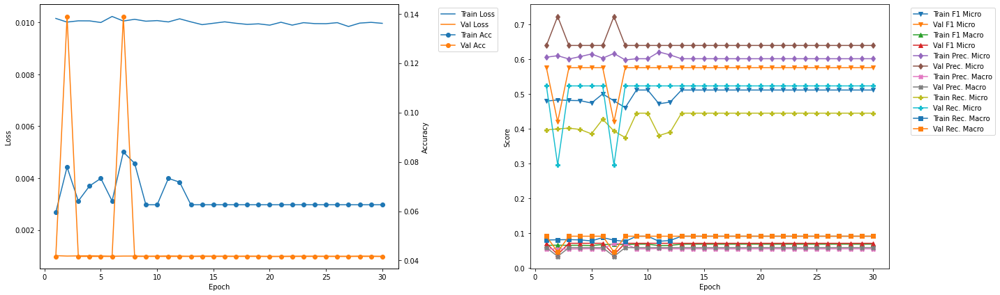

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.98
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4828 	Validation F1 Micro: 0.5605
Train F1 Marco: 0.0648 	Validation F1 Macro: 0.0722
Train Precision Mirco: 0.606 	Validation Precision Micro: 0.6597
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.06
Train Recall Mirco: 0.4013 	Validation Recall Micro: 0.4872
Train Recall Marco: 0.0804 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.12
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0519 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.4883 	Validation F1 Micro: 0.382
Train F1 Marco: 0.0653 	Validation F1 Macro: 0.0377
Train Precision Mirco: 0.5992 	Validation Precision Micro: 0.7083
Train Precision Marco: 0.0539 	Validation Precision Macro: 0.0322
Train Recall Mirco: 0.4121 	Va

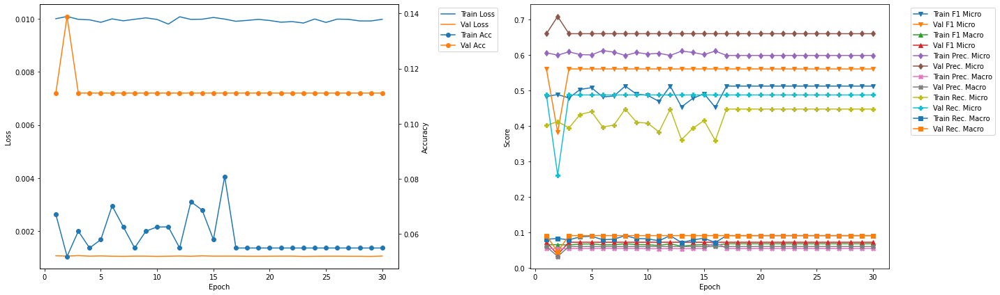

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.2
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0733 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4877 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0705 	Validation F1 Macro: 0.066
Train Precision Mirco: 0.6147 	Validation Precision Micro: 0.5694
Train Precision Marco: 0.0731 	Validation Precision Macro: 0.0518
Train Recall Mirco: 0.4042 	Validation Recall Micro: 0.4481
Train Recall Marco: 0.0811 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.35
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5185 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.066
Train Precision Mirco: 0.6084 	Validation Precision Micro: 0.5694
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0518
Train Recall Mirco: 0.4518 	V

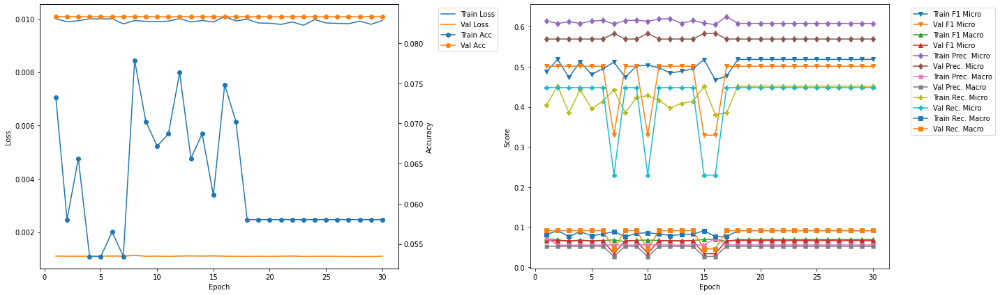

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 8 	Epoch: 1
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0595 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.479 	Validation F1 Micro: 0.575
Train F1 Marco: 0.0646 	Validation F1 Macro: 0.0706
Train Precision Mirco: 0.6052 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0581
Train Recall Mirco: 0.3964 	Validation Recall Micro: 0.5227
Train Recall Marco: 0.08 	Validation Recall Macro: 0.0909


In [21]:
resnet50LSTM_500_1_50_best = Kfold_train_CNN_RNN(model = resnet50LSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet50LSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.16
Train Loss: 0.0168 	Validation Loss: 0.0018
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0022 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0023 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0417 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0065 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0011 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0014 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.32
Train Loss: 0.0135 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

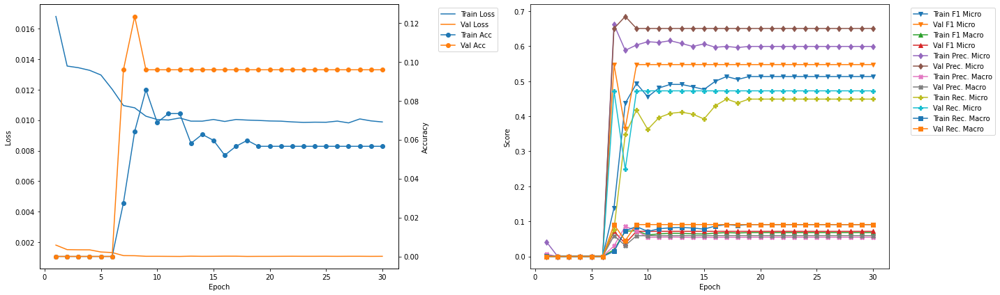

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.98
Train Loss: 0.012 	Validation Loss: 0.0012
Train Accuracy: 0.0046 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0663 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0147 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.504 	Validation Precision Micro: 0.0
Train Precision Marco: 0.06 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0355 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0085 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.14
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.3735 	Validation F1 Micro: 0.4654
Train F1 Marco: 0.0535 	Validation F1 Macro: 0.0608
Train Precision Mirco: 0.624 	Validation Precision Micro: 0.5068
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.0461
Train Recall Mirco: 0.2665 	Validation Recall Micro:

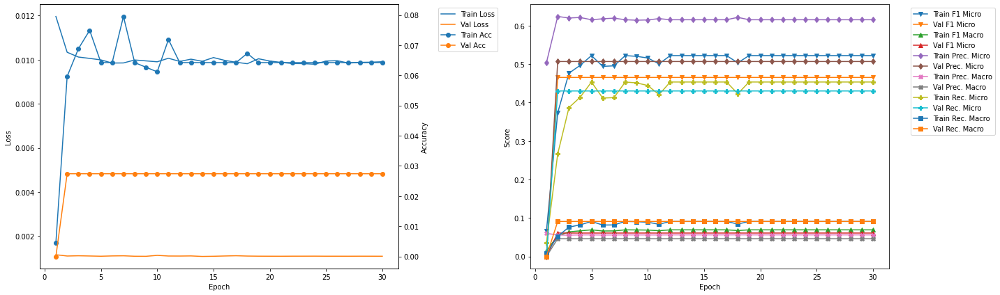

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 9.79
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0826 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4899 	Validation F1 Micro: 0.5233
Train F1 Marco: 0.066 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6231 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.056 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4037 	Validation Recall Micro: 0.4545
Train Recall Marco: 0.0803 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.95
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5162 	Validation F1 Micro: 0.5233
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6032 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4511 	Vali

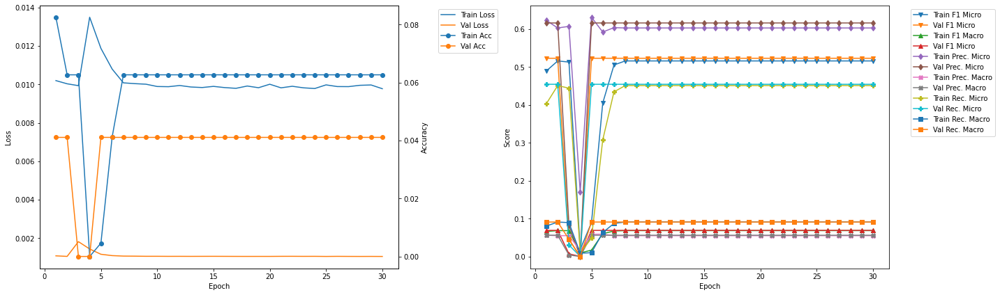

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.547550 --> 0.548287).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 14.61
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0642 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4946 	Validation F1 Micro: 0.5483
Train F1 Marco: 0.0665 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.6101 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.4159 	Validation Recall Micro: 0.5029
Train Recall Marco: 0.084 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.77
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0566 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4819 	Validation F1 Micro: 0.5483
Train F1 Marco: 0.0649 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.6097 	Validation Precision Micro: 0.6027
Train Precision 

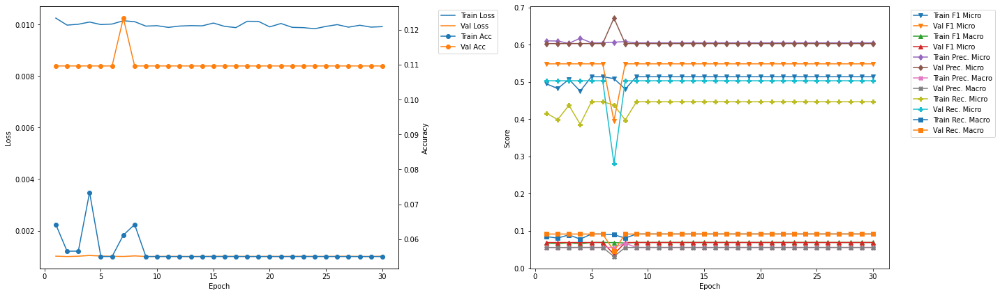

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.41
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0596 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4949 	Validation F1 Micro: 0.507
Train F1 Marco: 0.0657 	Validation F1 Macro: 0.0697
Train Precision Mirco: 0.6026 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.4198 	Validation Recall Micro: 0.4272
Train Recall Marco: 0.0832 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.57
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0765 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.495 	Validation F1 Micro: 0.507
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0697
Train Precision Mirco: 0.6103 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.4164 

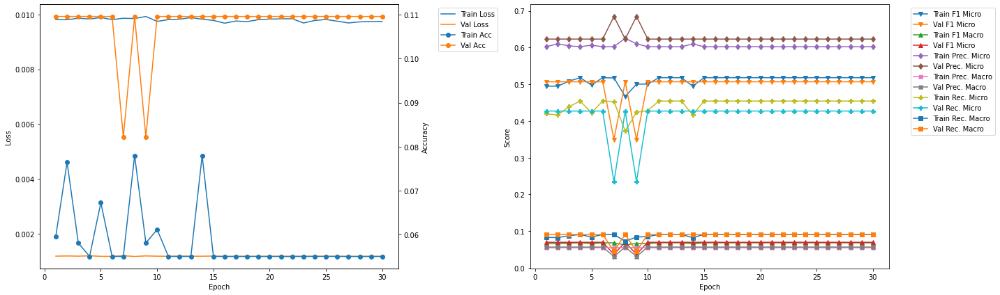

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.22
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.499 	Validation F1 Micro: 0.5187
Train F1 Marco: 0.0665 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.6101 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.055 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4221 	Validation Recall Micro: 0.4478
Train Recall Marco: 0.0842 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.38
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5167 	Validation F1 Micro: 0.5187
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.6032 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4519 	Vali

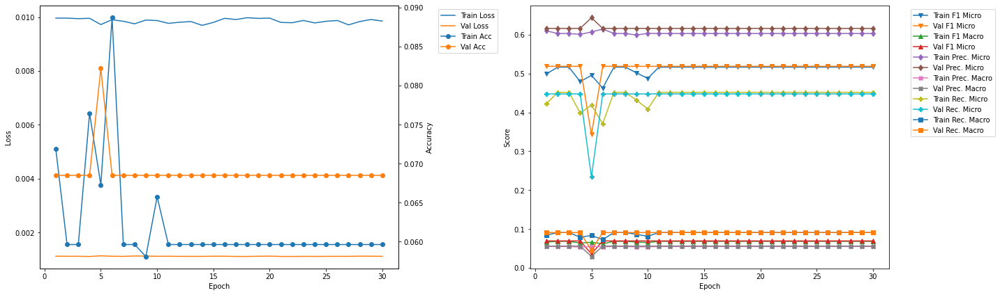

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.03
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0795 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5056 	Validation F1 Micro: 0.4686
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.0653
Train Precision Mirco: 0.6175 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.428 	Validation Recall Micro: 0.402
Train Recall Marco: 0.0844 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 29.19
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5225 	Validation F1 Micro: 0.4686
Train F1 Marco: 0.0687 	Validation F1 Macro: 0.0653
Train Precision Mirco: 0.6093 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4573

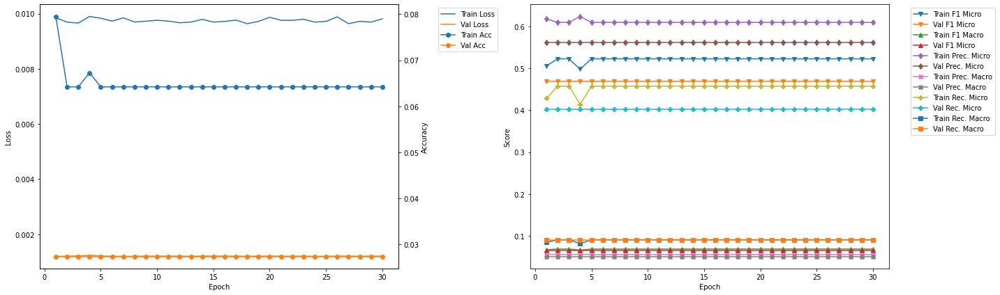

-------------------------------------------
FOLD 8
-------------------------------------------
Validation F1 Micro Score Increased (0.548287 --> 0.573134).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 33.84
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0595 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5 	Validation F1 Micro: 0.5731
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0725
Train Precision Mirco: 0.5984 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.0606
Train Recall Mirco: 0.4294 	Validation Recall Micro: 0.5026
Train Recall Marco: 0.0872 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.0
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0779 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4674 	Validation F1 Micro: 0.5731
Train F1 Marco: 0.0631 	Validation F1 Macro: 0.0725
Train Precision Mirco: 0.612 	Validation Precision Micro: 0.6667
Train Precision Mar

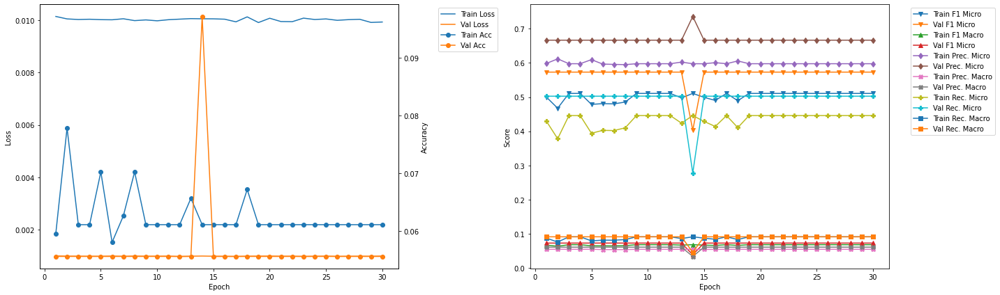

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.65
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0656 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.5168 	Validation F1 Micro: 0.5174
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.6031 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.4522 	Validation Recall Micro: 0.445
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.81
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0656 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.5168 	Validation F1 Micro: 0.5174
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.6031 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.452

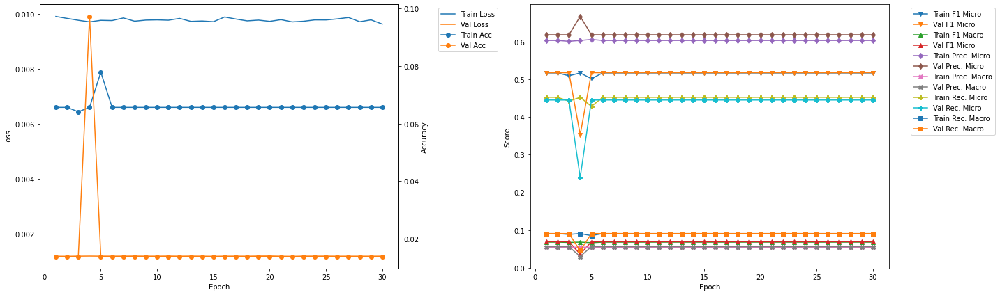

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 43.46
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0641 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4871 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.0667
Train Precision Mirco: 0.6121 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.4046 	Validation Recall Micro: 0.4375
Train Recall Marco: 0.0801 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 43.62
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5188 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0667
Train Precision Mirco: 0.6069 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.453 	Vali

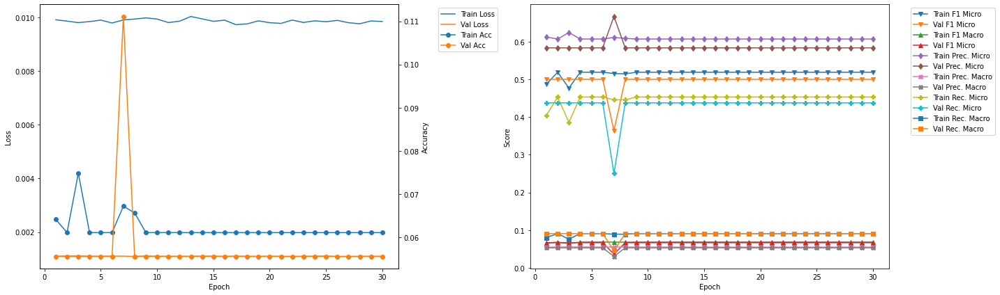

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 8 	Epoch: 1
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0595 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5 	Validation F1 Micro: 0.5731
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0725
Train Precision Mirco: 0.5984 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.0606
Train Recall Mirco: 0.4294 	Validation Recall Micro: 0.5026
Train Recall Marco: 0.0872 	Validation Recall Macro: 0.0909


In [22]:
resnet101LSTM_500_1_50_best = Kfold_train_CNN_RNN(model = resnet101LSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet101LSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.14
Train Loss: 0.0168 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0602 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0404 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1303 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1244 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0391 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0306 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.29
Train Loss: 0.0128 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

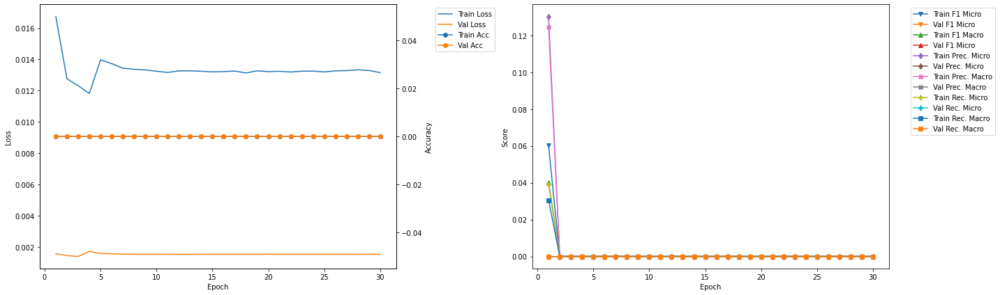

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.47
Train Loss: 0.0135 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.61
Train Loss: 0.0134 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

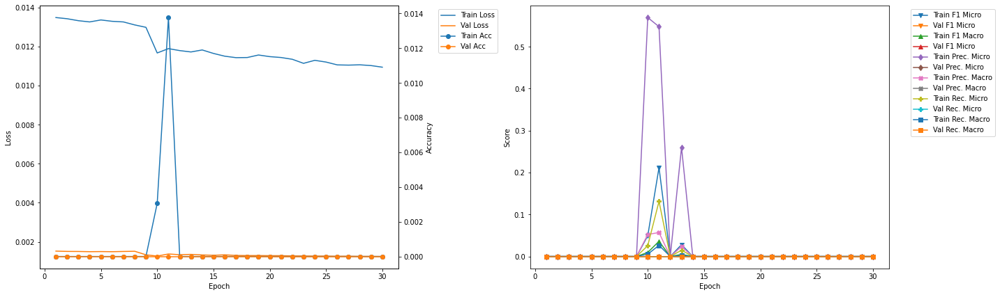

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.000000 --> 0.546479).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 8.8
Train Loss: 0.0104 	Validation Loss: 0.0011
Train Accuracy: 0.0229 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.3333 	Validation F1 Micro: 0.5465
Train F1 Marco: 0.0467 	Validation F1 Macro: 0.072
Train Precision Mirco: 0.5781 	Validation Precision Micro: 0.6644
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0604
Train Recall Mirco: 0.2342 	Validation Recall Micro: 0.4641
Train Recall Marco: 0.05 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.94
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5123 	Validation F1 Micro: 0.5465
Train F1 Marco: 0.075 	Validation F1 Macro: 0.072
Train Precision Mirco: 0.5839 	Validation Precision Micro: 0.6644
Train Precision Ma

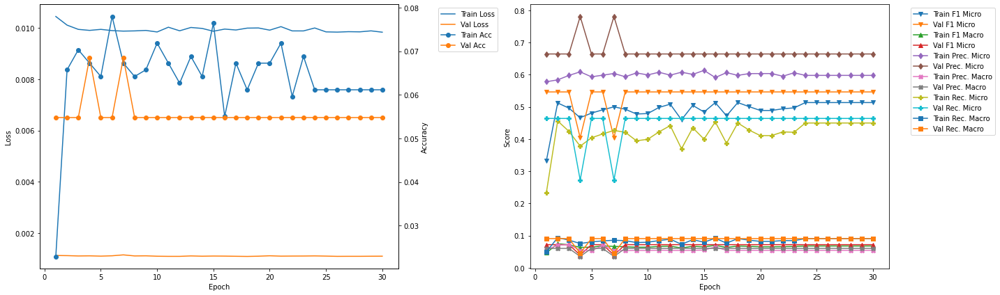

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 13.13
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5151 	Validation F1 Micro: 0.4847
Train F1 Marco: 0.0744 	Validation F1 Macro: 0.0638
Train Precision Mirco: 0.6055 	Validation Precision Micro: 0.5411
Train Precision Marco: 0.0762 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.4482 	Validation Recall Micro: 0.4389
Train Recall Marco: 0.091 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 13.27
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4949 	Validation F1 Micro: 0.4847
Train F1 Marco: 0.0662 	Validation F1 Macro: 0.0638
Train Precision Mirco: 0.6171 	Validation Precision Micro: 0.5411
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.413

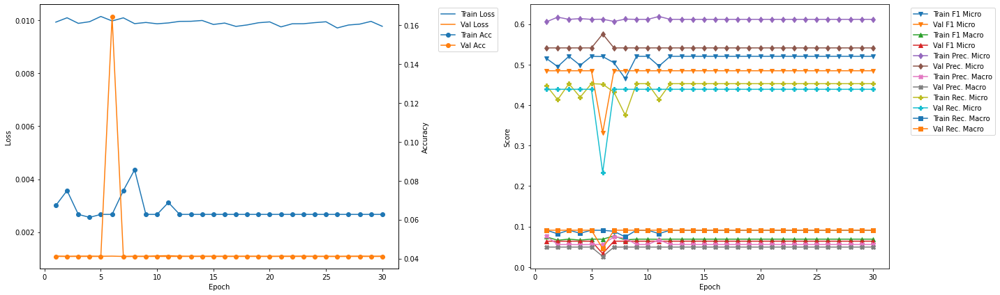

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.45
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0688 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5115 	Validation F1 Micro: 0.3273
Train F1 Marco: 0.0677 	Validation F1 Macro: 0.0347
Train Precision Mirco: 0.6116 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.028
Train Recall Mirco: 0.4395 	Validation Recall Micro: 0.2228
Train Recall Marco: 0.0872 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.6
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0826 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.471 	Validation F1 Micro: 0.5368
Train F1 Marco: 0.0694 	Validation F1 Macro: 0.0923
Train Precision Mirco: 0.6136 	Validation Precision Micro: 0.516
Train Precision Marco: 0.0773 	Validation Precision Macro: 0.0704
Train Recall Mirco: 0.3822 	

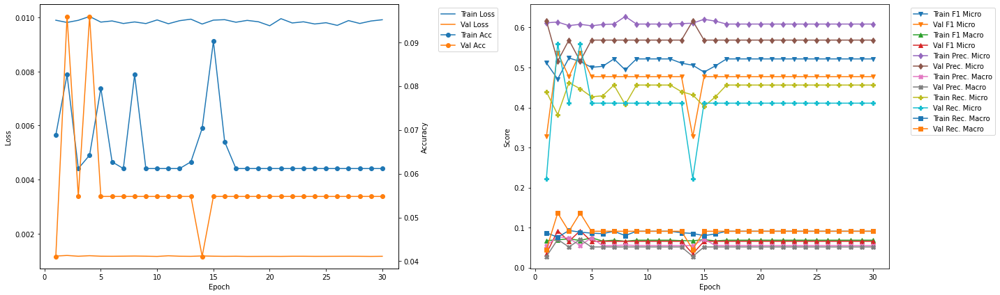

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.78
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4947 	Validation F1 Micro: 0.5273
Train F1 Marco: 0.0711 	Validation F1 Macro: 0.0678
Train Precision Mirco: 0.601 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0713 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4203 	Validation Recall Micro: 0.4728
Train Recall Marco: 0.0852 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.92
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5158 	Validation F1 Micro: 0.5273
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0678
Train Precision Mirco: 0.6055 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4492

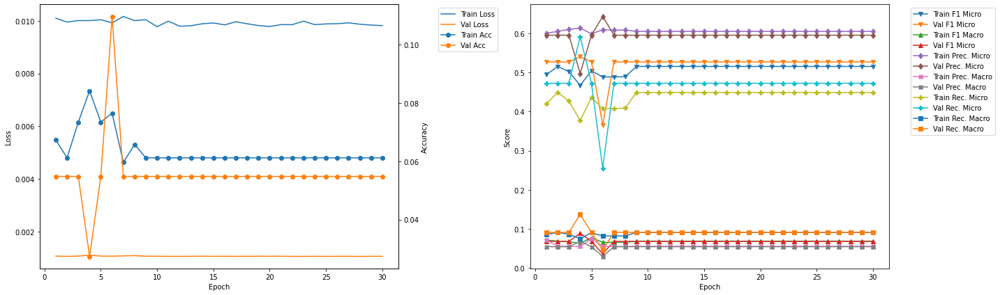

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.11
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.078 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5096 	Validation F1 Micro: 0.4809
Train F1 Marco: 0.0738 	Validation F1 Macro: 0.0653
Train Precision Mirco: 0.6097 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0764 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4378 	Validation Recall Micro: 0.4205
Train Recall Marco: 0.0883 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.25
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5209 	Validation F1 Micro: 0.4809
Train F1 Marco: 0.0687 	Validation F1 Macro: 0.0653
Train Precision Mirco: 0.6093 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.454

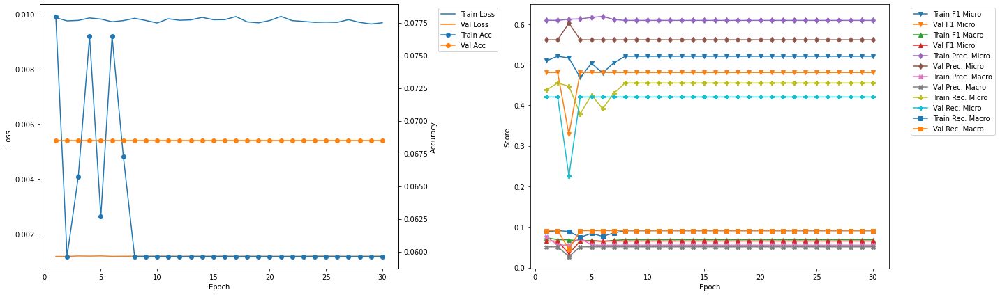

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.43
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0595 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5043 	Validation F1 Micro: 0.535
Train F1 Marco: 0.0672 	Validation F1 Macro: 0.0689
Train Precision Mirco: 0.6048 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.4325 	Validation Recall Micro: 0.4757
Train Recall Marco: 0.0872 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.58
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0748 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4735 	Validation F1 Micro: 0.535
Train F1 Marco: 0.0636 	Validation F1 Macro: 0.0689
Train Precision Mirco: 0.6126 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.3859 	

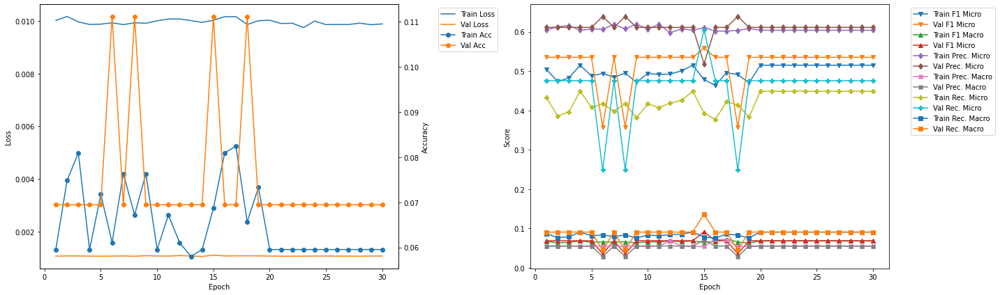

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.77
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0824 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4805 	Validation F1 Micro: 0.5285
Train F1 Marco: 0.0714 	Validation F1 Macro: 0.069
Train Precision Mirco: 0.6043 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0716 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.3987 	Validation Recall Micro: 0.4656
Train Recall Marco: 0.0808 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.91
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0824 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4618 	Validation F1 Micro: 0.5285
Train F1 Marco: 0.0624 	Validation F1 Macro: 0.069
Train Precision Mirco: 0.5982 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.376 	V

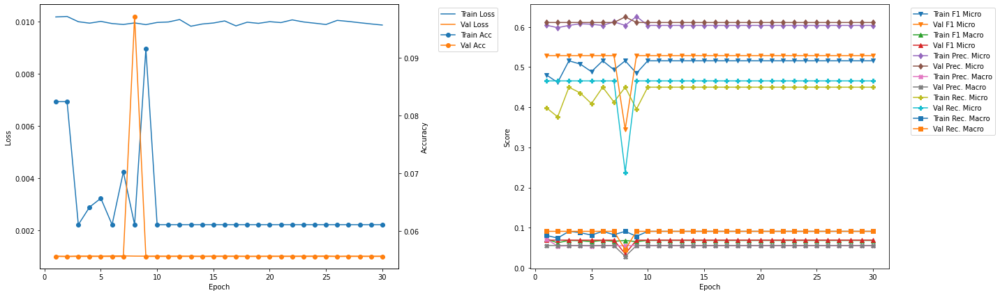

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.1
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0656 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5065 	Validation F1 Micro: 0.5509
Train F1 Marco: 0.0676 	Validation F1 Macro: 0.0704
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0581
Train Recall Mirco: 0.4348 	Validation Recall Micro: 0.4842
Train Recall Marco: 0.088 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.24
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0595 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4786 	Validation F1 Micro: 0.5509
Train F1 Marco: 0.0643 	Validation F1 Macro: 0.0704
Train Precision Mirco: 0.6017 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.0539 	Validation Precision Macro: 0.0581
Train Recall Mirco: 0.3973 	V

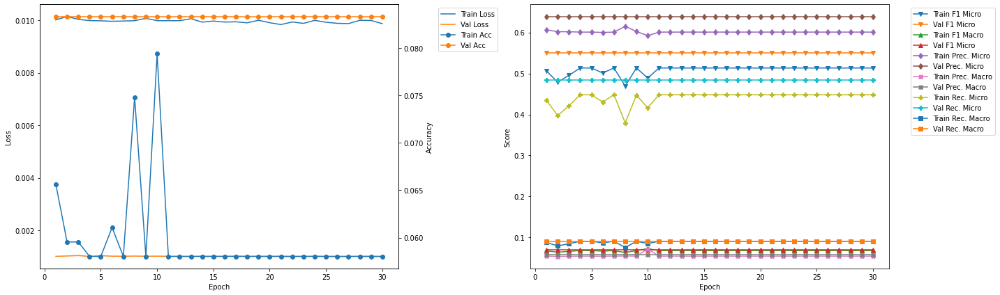

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 8 	Epoch: 15
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4784 	Validation F1 Micro: 0.5586
Train F1 Marco: 0.0642 	Validation F1 Macro: 0.0917
Train Precision Mirco: 0.6106 	Validation Precision Micro: 0.5185
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0707
Train Recall Mirco: 0.3933 	Validation Recall Micro: 0.6054
Train Recall Marco: 0.0783 	Validation Recall Macro: 0.1364


In [23]:
densenet121LSTM_500_1_50_best = Kfold_train_CNN_RNN(model = densenet121LSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet121LSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.16
Train Loss: 0.0165 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0011 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0009 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0227 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0012 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0006 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0007 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.31
Train Loss: 0.0123 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

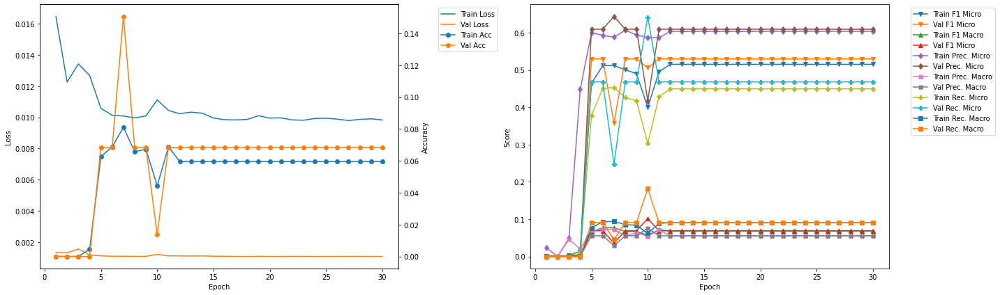

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.8
Train Loss: 0.0119 	Validation Loss: 0.0011
Train Accuracy: 0.0229 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.2101 	Validation F1 Micro: 0.3543
Train F1 Marco: 0.0376 	Validation F1 Macro: 0.0347
Train Precision Mirco: 0.5335 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0571 	Validation Precision Macro: 0.028
Train Recall Mirco: 0.1308 	Validation Recall Micro: 0.2486
Train Recall Marco: 0.0281 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.95
Train Loss: 0.0109 	Validation Loss: 0.0011
Train Accuracy: 0.0413 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4379 	Validation F1 Micro: 0.5076
Train F1 Marco: 0.0645 	Validation F1 Macro: 0.0658
Train Precision Mirco: 0.5928 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.0566 	Validation Precision Macro: 0.0517
Train Recall Mirco: 0.3471 	

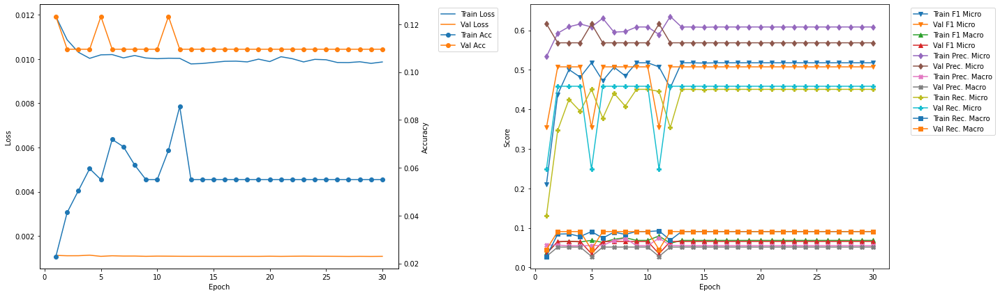

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 9.44
Train Loss: 0.0108 	Validation Loss: 0.0012
Train Accuracy: 0.0673 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4732 	Validation F1 Micro: 0.5099
Train F1 Marco: 0.0672 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.5996 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0729 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.3908 	Validation Recall Micro: 0.4348
Train Recall Marco: 0.0787 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.59
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0612 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5127 	Validation F1 Micro: 0.5099
Train F1 Marco: 0.0677 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6041 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4454 	

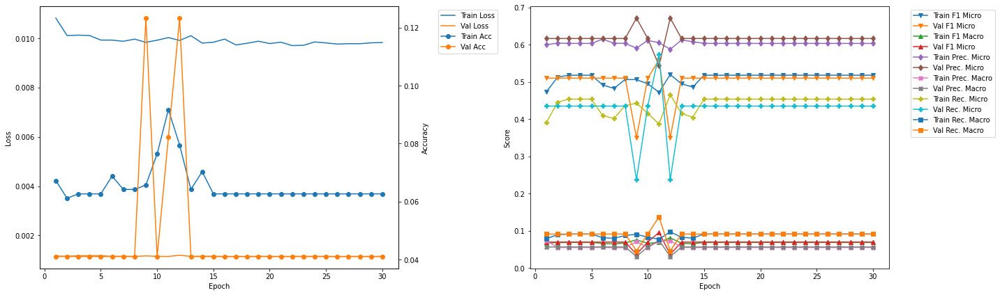

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.558685 --> 0.581040).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 14.08
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0734 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4712 	Validation F1 Micro: 0.581
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0713
Train Precision Mirco: 0.6028 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.0724 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.3867 	Validation Recall Micro: 0.5249
Train Recall Marco: 0.0784 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.23
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5 	Validation F1 Micro: 0.581
Train F1 Marco: 0.067 	Validation F1 Macro: 0.0713
Train Precision Mirco: 0.601 	Validation Precision Micro: 0.6507
Train Precision Marco

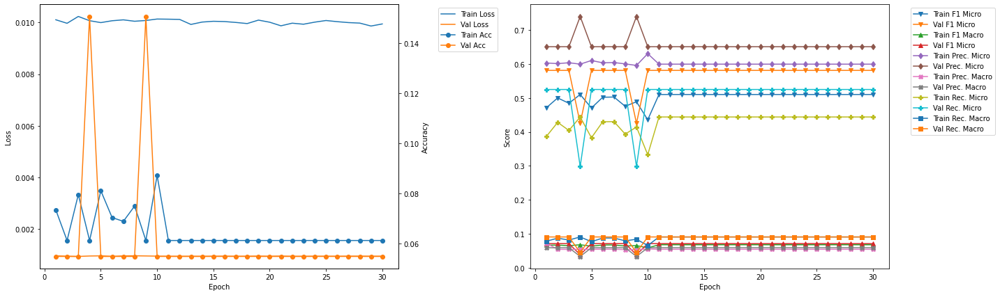

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.73
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4904 	Validation F1 Micro: 0.3623
Train F1 Marco: 0.0695 	Validation F1 Macro: 0.037
Train Precision Mirco: 0.5932 	Validation Precision Micro: 0.6849
Train Precision Marco: 0.0672 	Validation Precision Macro: 0.0311
Train Recall Mirco: 0.418 	Validation Recall Micro: 0.2463
Train Recall Marco: 0.0841 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.89
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5107 	Validation F1 Micro: 0.5215
Train F1 Marco: 0.0676 	Validation F1 Macro: 0.0697
Train Precision Mirco: 0.6025 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.4432 	

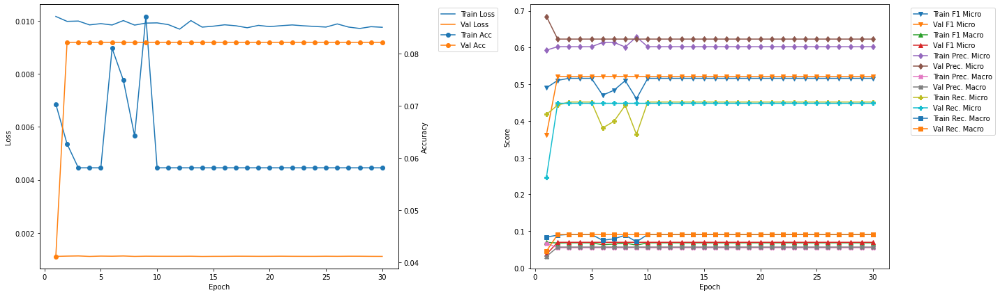

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.38
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4852 	Validation F1 Micro: 0.5272
Train F1 Marco: 0.065 	Validation F1 Macro: 0.0695
Train Precision Mirco: 0.6079 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.4037 	Validation Recall Micro: 0.4532
Train Recall Marco: 0.0804 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.53
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4858 	Validation F1 Micro: 0.5272
Train F1 Marco: 0.0649 	Validation F1 Macro: 0.0695
Train Precision Mirco: 0.601 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.054 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.4077 	V

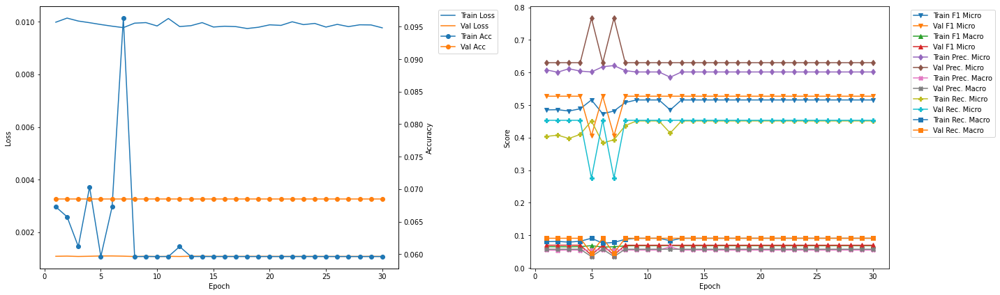

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.02
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0856 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4845 	Validation F1 Micro: 0.4865
Train F1 Marco: 0.0736 	Validation F1 Macro: 0.0648
Train Precision Mirco: 0.5952 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0726 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.4085 	Validation Recall Micro: 0.4332
Train Recall Marco: 0.0829 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.17
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.492 	Validation F1 Micro: 0.4865
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.0648
Train Precision Mirco: 0.612 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.4114 	Val

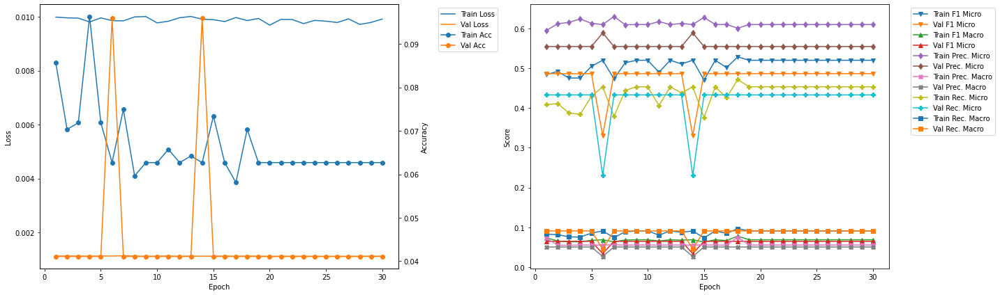

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 32.66
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0641 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.521 	Validation F1 Micro: 0.4816
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0672
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4568 	Validation Recall Micro: 0.4067
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 32.81
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0641 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.521 	Validation F1 Micro: 0.4816
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0672
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4568

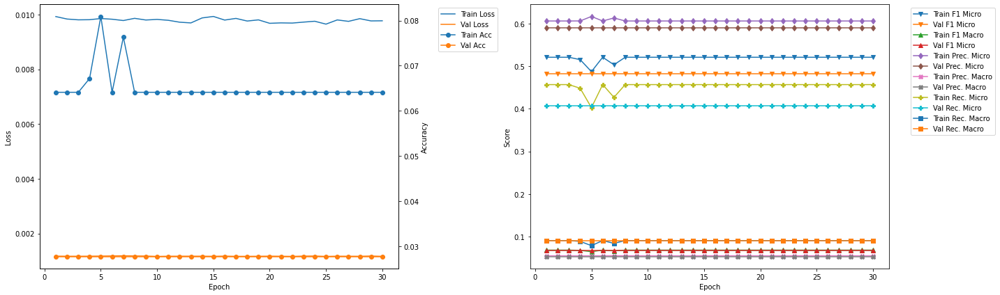

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 37.3
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0565 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5164 	Validation F1 Micro: 0.5215
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4499 	Validation Recall Micro: 0.467
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 37.46
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4988 	Validation F1 Micro: 0.5215
Train F1 Marco: 0.0666 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6073 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4232 

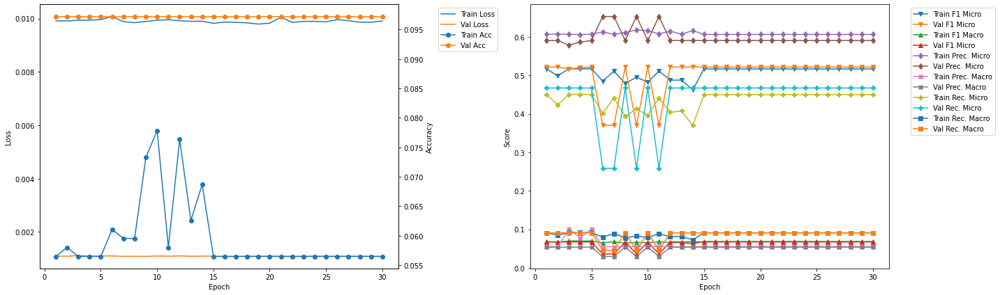

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 41.94
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0779 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.4998 	Validation F1 Micro: 0.5057
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.0689
Train Precision Mirco: 0.6099 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.4234 	Validation Recall Micro: 0.4314
Train Recall Marco: 0.0841 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.1
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0702 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.4835 	Validation F1 Micro: 0.5057
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0689
Train Precision Mirco: 0.6127 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.1002 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.3993 

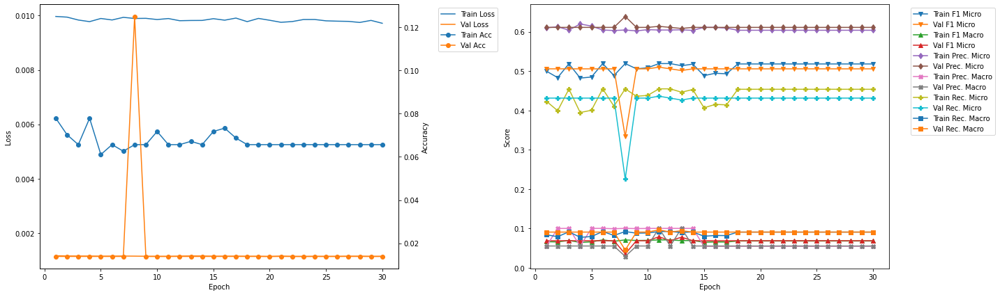

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 4 	Epoch: 1
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0734 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4712 	Validation F1 Micro: 0.581
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0713
Train Precision Mirco: 0.6028 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.0724 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.3867 	Validation Recall Micro: 0.5249
Train Recall Marco: 0.0784 	Validation Recall Macro: 0.0909


In [24]:
densenet169LSTM_500_1_50_best = Kfold_train_CNN_RNN(model = densenet169LSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet169LSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.17
Train Loss: 0.0158 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0649 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0483 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1429 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1171 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.042 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0489 	Validation Recall Macro: 0.0

Validation F1 Micro Score Increased (0.000000 --> 0.403101).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.33
Train Loss: 0.0112 	Validation Loss: 0.0011
Train Accuracy: 0.0168 	Validation Accuracy: 0.1781
Train F1 Mirco: 0.1874 	Validation F1 Micro: 0.4031
Train F1 Marco: 0.0316 	Validation F1 Macro: 0.0378
Train Precision Mirco: 0.6299 	Validation Precision Micro: 0.7123
Train Precision Marco: 0.0564 	Valida

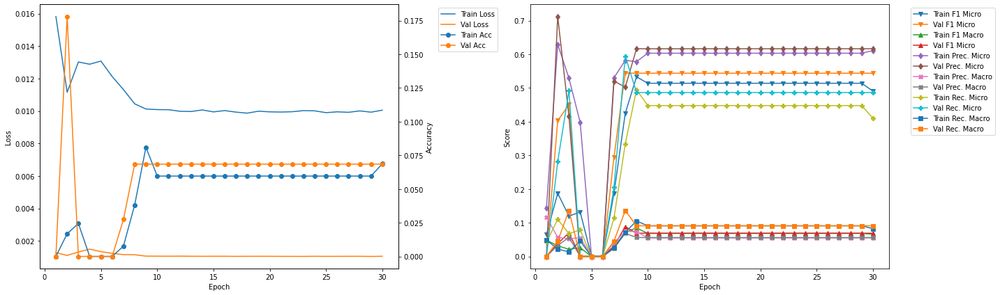

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.11
Train Loss: 0.0118 	Validation Loss: 0.0013
Train Accuracy: 0.0107 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.1904 	Validation F1 Micro: 0.2756
Train F1 Marco: 0.037 	Validation F1 Macro: 0.0295
Train Precision Mirco: 0.4872 	Validation Precision Micro: 0.4795
Train Precision Marco: 0.0734 	Validation Precision Macro: 0.0218
Train Recall Mirco: 0.1183 	Validation Recall Micro: 0.1934
Train Recall Marco: 0.0271 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.27
Train Loss: 0.0104 	Validation Loss: 0.0012
Train Accuracy: 0.0566 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4268 	Validation F1 Micro: 0.4465
Train F1 Marco: 0.0652 	Validation F1 Macro: 0.0606
Train Precision Mirco: 0.598 	Validation Precision Micro: 0.5
Train Precision Marco: 0.0739 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.3318 	Val

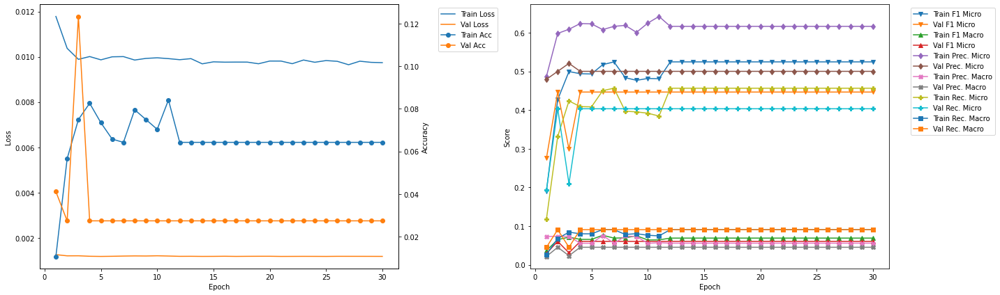

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 10.04
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0887 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4558 	Validation F1 Micro: 0.5141
Train F1 Marco: 0.061 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.621 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.36 	Validation Recall Micro: 0.4375
Train Recall Marco: 0.0703 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 10.2
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0734 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4901 	Validation F1 Micro: 0.5141
Train F1 Marco: 0.0654 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6052 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.4117 	Vali

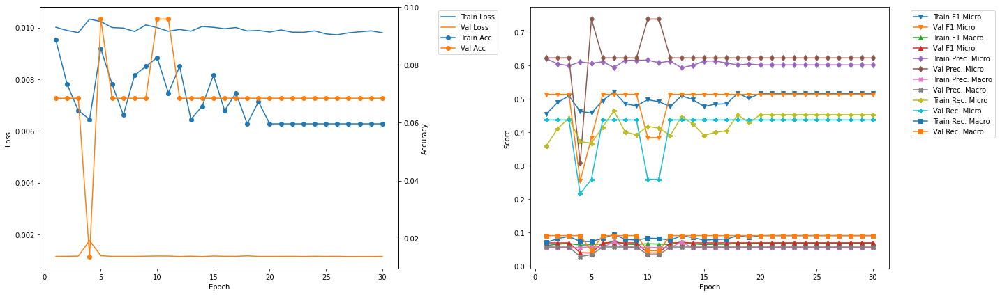

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 14.97
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0841 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4631 	Validation F1 Micro: 0.5057
Train F1 Marco: 0.0619 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.6134 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.3719 	Validation Recall Micro: 0.4356
Train Recall Marco: 0.0727 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.14
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0642 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4844 	Validation F1 Micro: 0.5057
Train F1 Marco: 0.0648 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.6152 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.3994

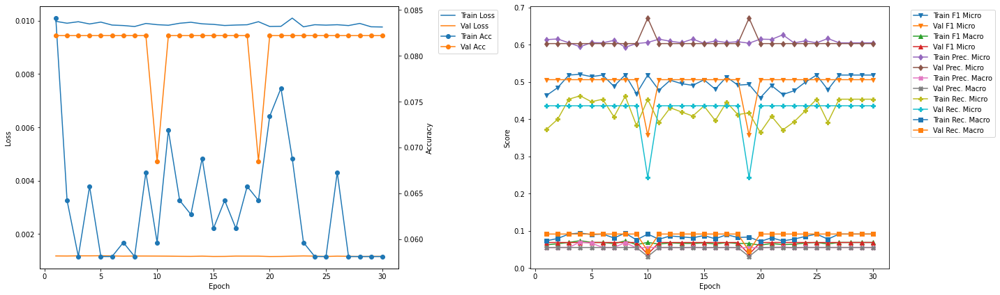

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.9
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5114 	Validation F1 Micro: 0.3358
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0347
Train Precision Mirco: 0.6059 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.028
Train Recall Mirco: 0.4424 	Validation Recall Micro: 0.2308
Train Recall Marco: 0.089 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 20.07
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0856 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4594 	Validation F1 Micro: 0.522
Train F1 Marco: 0.0616 	Validation F1 Macro: 0.0689
Train Precision Mirco: 0.629 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.3619 	V

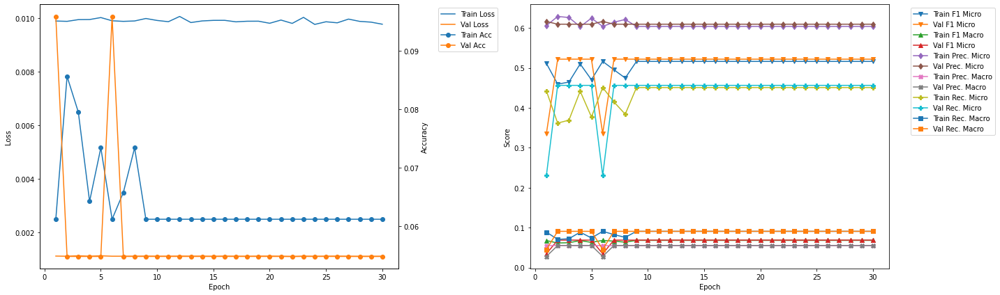

-------------------------------------------
FOLD 6
-------------------------------------------
Validation F1 Micro Score Increased (0.544554 --> 0.548105).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 24.85
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4752 	Validation F1 Micro: 0.5481
Train F1 Marco: 0.0638 	Validation F1 Macro: 0.0711
Train Precision Mirco: 0.6046 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.054 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.3914 	Validation Recall Micro: 0.4772
Train Recall Marco: 0.078 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.01
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.137
Train F1 Mirco: 0.5091 	Validation F1 Micro: 0.3778
Train F1 Marco: 0.0677 	Validation F1 Macro: 0.0374
Train Precision Mirco: 0.6028 	Validation Precision Micro: 0.6986
Train Precision M

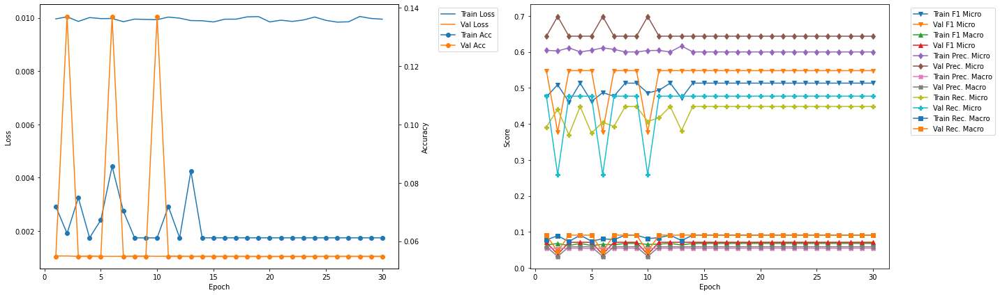

-------------------------------------------
FOLD 7
-------------------------------------------
Validation F1 Micro Score Increased (0.548105 --> 0.565598).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 29.78
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0765 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4828 	Validation F1 Micro: 0.5656
Train F1 Marco: 0.0648 	Validation F1 Macro: 0.072
Train Precision Mirco: 0.5985 	Validation Precision Micro: 0.6644
Train Precision Marco: 0.0538 	Validation Precision Macro: 0.0604
Train Recall Mirco: 0.4046 	Validation Recall Micro: 0.4924
Train Recall Marco: 0.0814 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 29.95
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0734 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4807 	Validation F1 Micro: 0.5656
Train F1 Marco: 0.0647 	Validation F1 Macro: 0.072
Train Precision Mirco: 0.6036 	Validation Precision Micro: 0.6644
Train Precision 

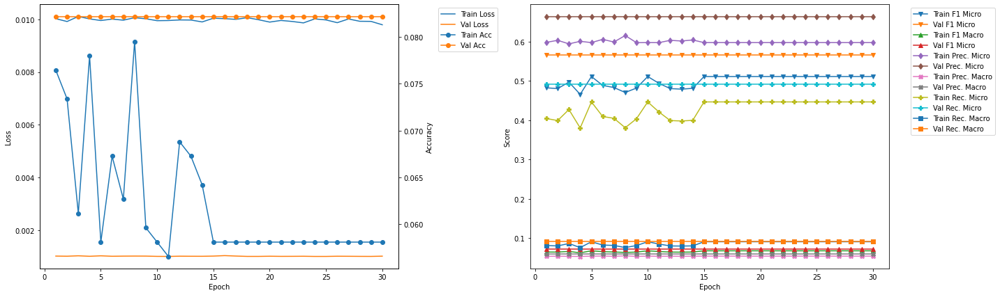

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.74
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0733 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4993 	Validation F1 Micro: 0.5217
Train F1 Marco: 0.0668 	Validation F1 Macro: 0.0657
Train Precision Mirco: 0.6073 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.424 	Validation Recall Micro: 0.4719
Train Recall Marco: 0.0853 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.9
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5164 	Validation F1 Micro: 0.5217
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0657
Train Precision Mirco: 0.6069 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.4494 	Va

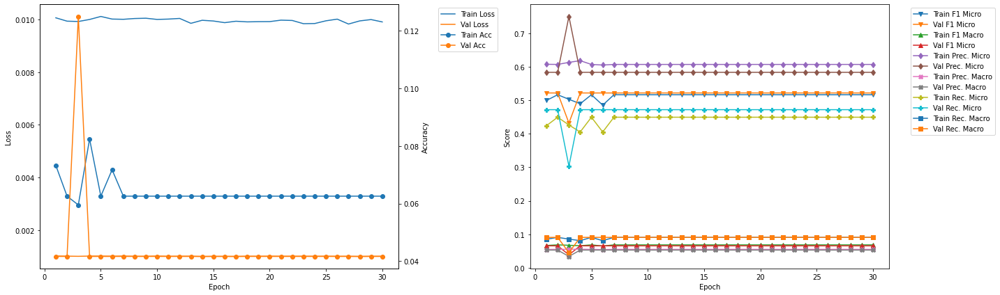

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.68
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0565 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4935 	Validation F1 Micro: 0.4731
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.0644
Train Precision Mirco: 0.6127 	Validation Precision Micro: 0.5486
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0499
Train Recall Mirco: 0.4132 	Validation Recall Micro: 0.4158
Train Recall Marco: 0.0814 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.84
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5217 	Validation F1 Micro: 0.4731
Train F1 Marco: 0.0687 	Validation F1 Macro: 0.0644
Train Precision Mirco: 0.6107 	Validation Precision Micro: 0.5486
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0499
Train Recall Mirco: 0.455

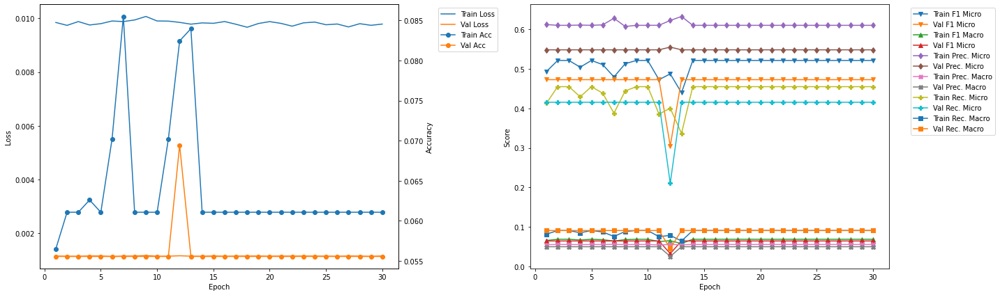

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 44.62
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0855 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4639 	Validation F1 Micro: 0.5251
Train F1 Marco: 0.0619 	Validation F1 Macro: 0.0718
Train Precision Mirco: 0.6203 	Validation Precision Micro: 0.6528
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0593
Train Recall Mirco: 0.3705 	Validation Recall Micro: 0.4393
Train Recall Marco: 0.0721 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 44.78
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4921 	Validation F1 Micro: 0.5251
Train F1 Marco: 0.0654 	Validation F1 Macro: 0.0718
Train Precision Mirco: 0.6059 	Validation Precision Micro: 0.6528
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0593
Train Recall Mirco: 0.4

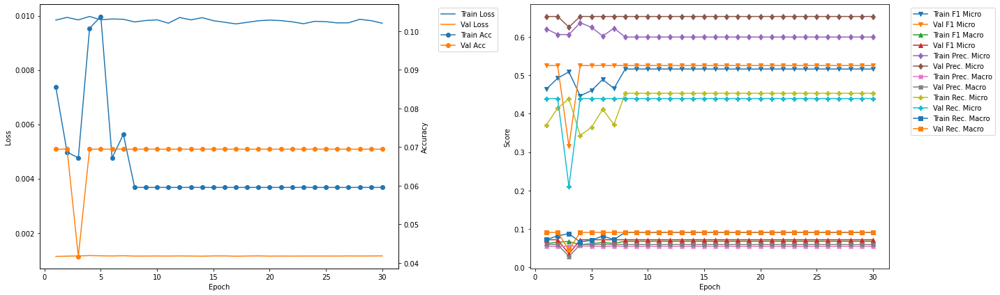

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 7 	Epoch: 1
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0765 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4828 	Validation F1 Micro: 0.5656
Train F1 Marco: 0.0648 	Validation F1 Macro: 0.072
Train Precision Mirco: 0.5985 	Validation Precision Micro: 0.6644
Train Precision Marco: 0.0538 	Validation Precision Macro: 0.0604
Train Recall Mirco: 0.4046 	Validation Recall Micro: 0.4924
Train Recall Marco: 0.0814 	Validation Recall Macro: 0.0909


In [25]:
densenet201LSTM_500_1_50_best = Kfold_train_CNN_RNN(model = densenet201LSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet201LSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.19
Train Loss: 0.0166 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0544 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0404 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1202 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1177 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0352 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0285 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.38
Train Loss: 0.0127 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

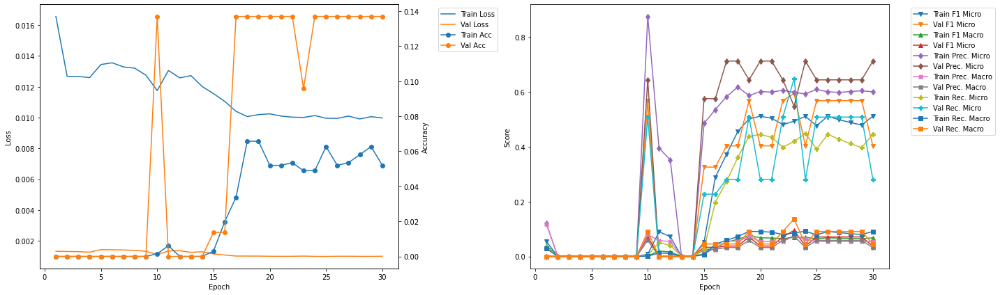

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.88
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4858 	Validation F1 Micro: 0.5087
Train F1 Marco: 0.065 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6142 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.4018 	Validation Recall Micro: 0.44
Train Recall Marco: 0.0794 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.07
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4926 	Validation F1 Micro: 0.5087
Train F1 Marco: 0.0658 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6185 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.4093 	Va

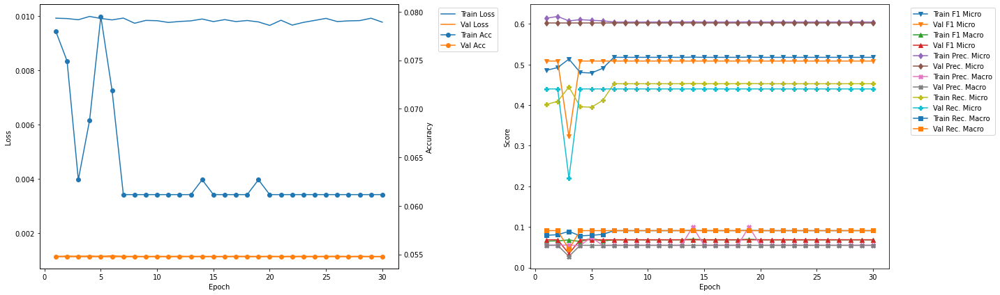

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.53
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4841 	Validation F1 Micro: 0.5111
Train F1 Marco: 0.0718 	Validation F1 Macro: 0.0844
Train Precision Mirco: 0.6086 	Validation Precision Micro: 0.4793
Train Precision Marco: 0.0815 	Validation Precision Macro: 0.0652
Train Recall Mirco: 0.4018 	Validation Recall Micro: 0.5474
Train Recall Marco: 0.0839 	Validation Recall Macro: 0.1327

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.72
Train Loss: 0.0119 	Validation Loss: 0.0013
Train Accuracy: 0.0275 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2348 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0472 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5037 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0852 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1531 	Validation Re

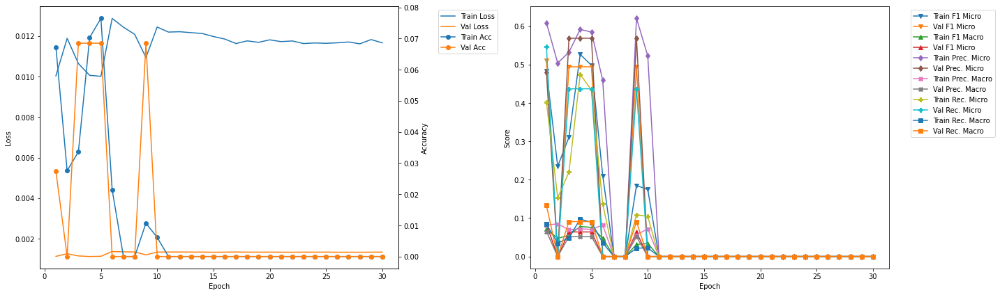

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.18
Train Loss: 0.0125 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.36
Train Loss: 0.0112 	Validation Loss: 0.0012
Train Accuracy: 0.0122 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.0559 	Validation F1 Micro: 0.3404
Train F1 Marco: 0.0089 	Validation F1 Macro: 0.0401
Train Precision Mirco: 0.6296 	Validation Precision Micro: 0.6154
Train Precision Marco: 0.0286 	Validation Precision Macro: 0.0553
Train Recall Mirco: 0.0293 	Validation Recall Micro: 0.2353
Train 

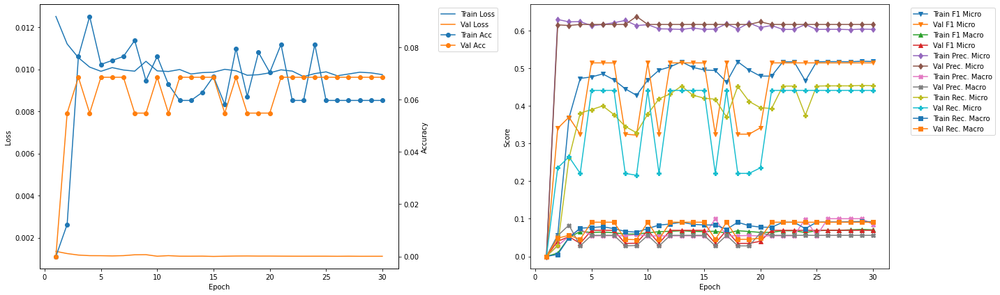

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.82
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4638 	Validation F1 Micro: 0.5322
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.07
Train Precision Mirco: 0.612 	Validation Precision Micro: 0.6319
Train Precision Marco: 0.1244 	Validation Precision Macro: 0.0574
Train Recall Mirco: 0.3734 	Validation Recall Micro: 0.4596
Train Recall Marco: 0.0754 	Validation Recall Macro: 0.09

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.01
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4791 	Validation F1 Micro: 0.5349
Train F1 Marco: 0.067 	Validation F1 Macro: 0.0704
Train Precision Mirco: 0.6058 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.1459 	Validation Precision Macro: 0.0576
Train Recall Mirco: 0.3962 	Va

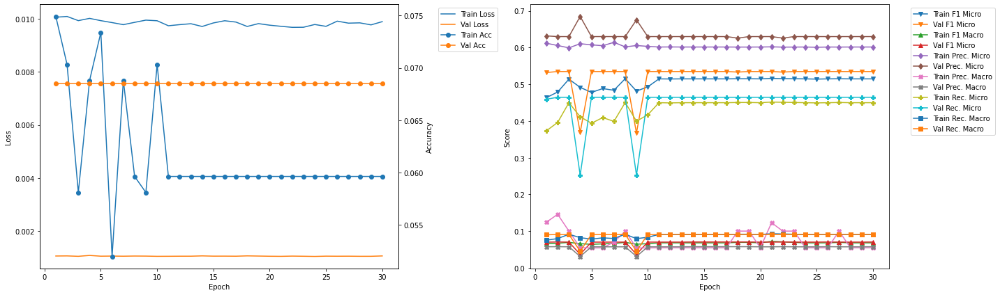

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.48
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.505 	Validation F1 Micro: 0.3521
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0481
Train Precision Mirco: 0.6051 	Validation Precision Micro: 0.6351
Train Precision Marco: 0.1002 	Validation Precision Macro: 0.0741
Train Recall Mirco: 0.4333 	Validation Recall Micro: 0.2435
Train Recall Marco: 0.0871 	Validation Recall Macro: 0.053

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.66
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0826 	Validation Accuracy: 0.0
Train F1 Mirco: 0.4881 	Validation F1 Micro: 0.5029
Train F1 Marco: 0.0718 	Validation F1 Macro: 0.0782
Train Precision Mirco: 0.616 	Validation Precision Micro: 0.5772
Train Precision Marco: 0.0707 	Validation Precision Macro: 0.0757
Train Recall Mirco: 0.4042 	Va

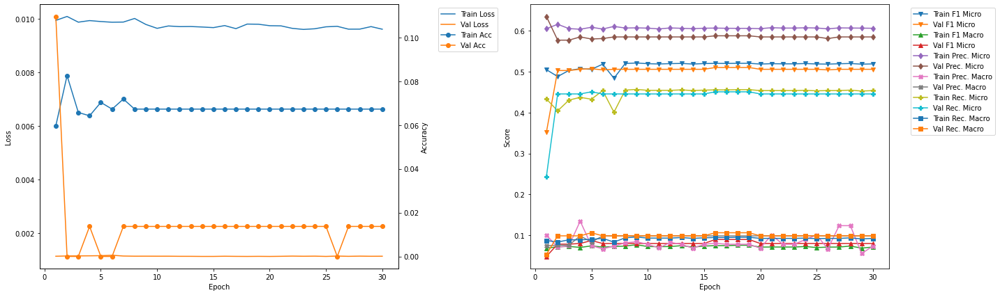

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.12
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4987 	Validation F1 Micro: 0.5235
Train F1 Marco: 0.0693 	Validation F1 Macro: 0.0761
Train Precision Mirco: 0.6096 	Validation Precision Micro: 0.6054
Train Precision Marco: 0.0703 	Validation Precision Macro: 0.1002
Train Recall Mirco: 0.4219 	Validation Recall Micro: 0.4611
Train Recall Marco: 0.0856 	Validation Recall Macro: 0.0955

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.31
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4893 	Validation F1 Micro: 0.5235
Train F1 Marco: 0.0668 	Validation F1 Macro: 0.0761
Train Precision Mirco: 0.6068 	Validation Precision Micro: 0.6054
Train Precision Marco: 0.0773 	Validation Precision Macro: 0.1002
Train Recall Mirco: 0.4099

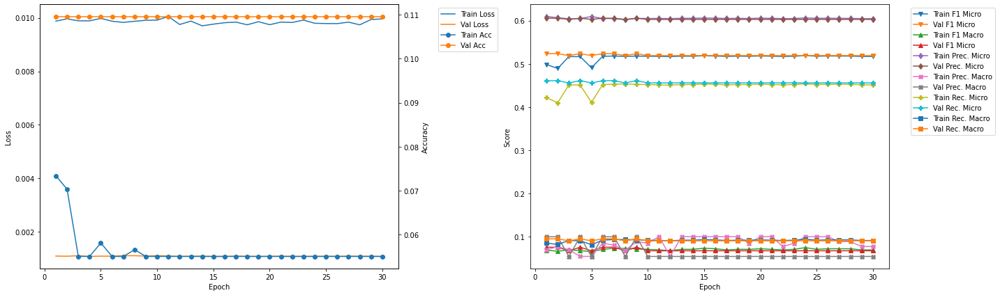

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.77
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0595 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5156 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0721 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.609 	Validation Precision Micro: 0.5793
Train Precision Marco: 0.0893 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.447 	Validation Recall Micro: 0.4398
Train Recall Marco: 0.0914 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.96
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0716 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.611 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0854 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.4231 	Validatio

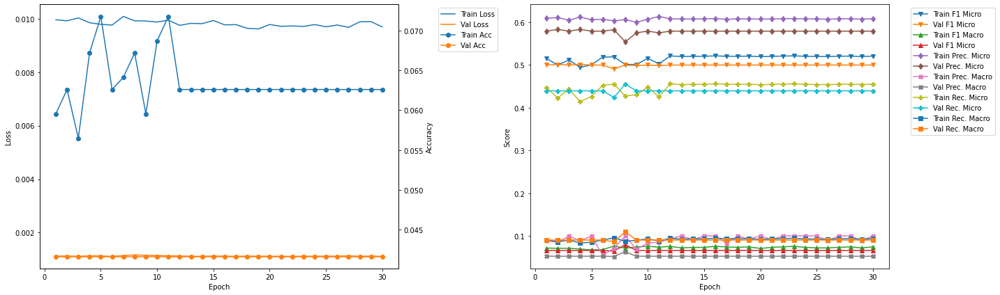

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 45.42
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.0
Train F1 Mirco: 0.4901 	Validation F1 Micro: 0.4834
Train F1 Marco: 0.0716 	Validation F1 Macro: 0.0727
Train Precision Mirco: 0.6167 	Validation Precision Micro: 0.5517
Train Precision Marco: 0.0836 	Validation Precision Macro: 0.0953
Train Recall Mirco: 0.4066 	Validation Recall Micro: 0.4301
Train Recall Marco: 0.0832 	Validation Recall Macro: 0.0955

Epoch 2 	Learning Rate: 0.01 	Time (min): 45.6
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.0
Train F1 Mirco: 0.5229 	Validation F1 Micro: 0.4819
Train F1 Marco: 0.0752 	Validation F1 Macro: 0.072
Train Precision Mirco: 0.6108 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.0839 	Validation Precision Macro: 0.0726
Train Recall Mirco: 0.4571 	Vali

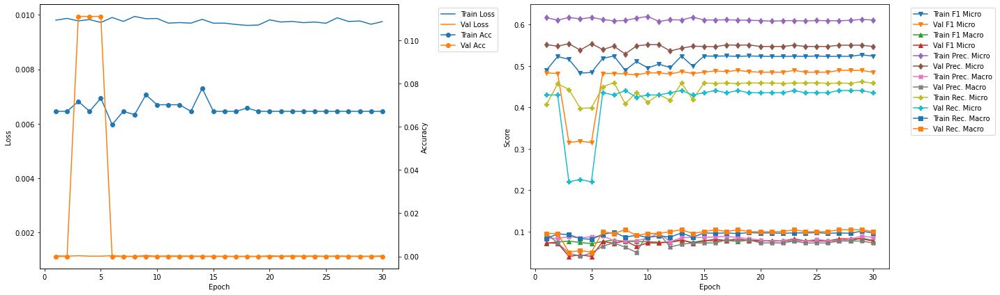

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 51.06
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0656 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5005 	Validation F1 Micro: 0.547
Train F1 Marco: 0.0732 	Validation F1 Macro: 0.0727
Train Precision Mirco: 0.5989 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0737 	Validation Precision Macro: 0.0606
Train Recall Mirco: 0.4299 	Validation Recall Micro: 0.4638
Train Recall Marco: 0.0897 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 51.25
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5145 	Validation F1 Micro: 0.5408
Train F1 Marco: 0.0744 	Validation F1 Macro: 0.0727
Train Precision Mirco: 0.5946 	Validation Precision Micro: 0.6486
Train Precision Marco: 0.0704 	Validation Precision Macro: 0.0606
Train Recall Mirco: 0.45

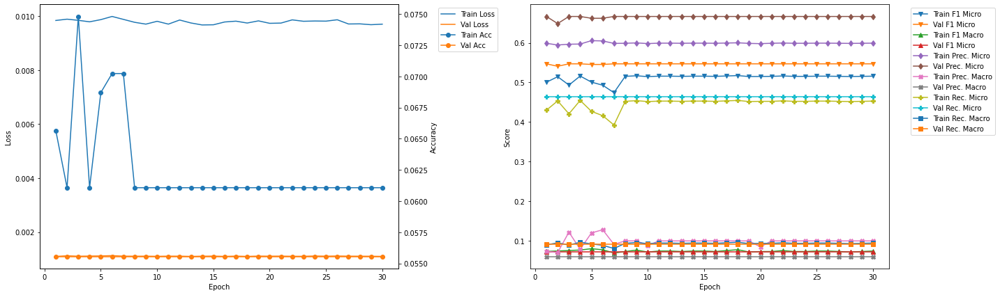

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 1 	Epoch: 23
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0489 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.493 	Validation F1 Micro: 0.5941
Train F1 Marco: 0.0698 	Validation F1 Macro: 0.0949
Train Precision Mirco: 0.5979 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.0746 	Validation Precision Macro: 0.0747
Train Recall Mirco: 0.4194 	Validation Recall Micro: 0.6486
Train Recall Marco: 0.0856 	Validation Recall Macro: 0.1364


In [26]:
vgg11bnLSTM_500_1_50_best = Kfold_train_CNN_RNN(model = vgg11bnLSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg11bnLSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.2
Train Loss: 0.0161 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0559 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0394 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1248 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1181 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.036 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0307 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.4
Train Loss: 0.0122 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Vali

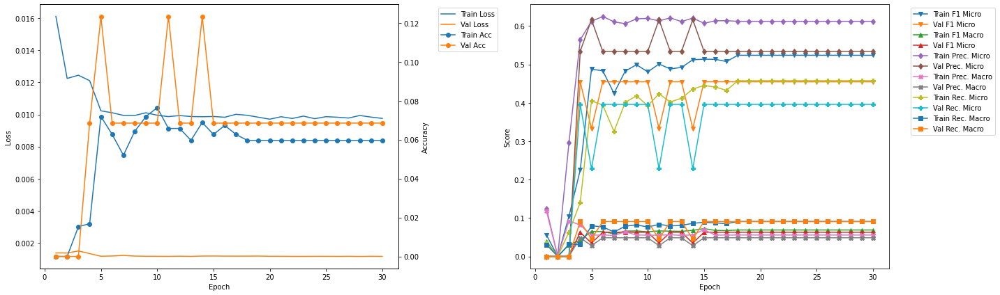

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.454810 --> 0.572816).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 6.3
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4554 	Validation F1 Micro: 0.5728
Train F1 Marco: 0.0622 	Validation F1 Macro: 0.094
Train Precision Mirco: 0.5965 	Validation Precision Micro: 0.5388
Train Precision Marco: 0.0538 	Validation Precision Macro: 0.0735
Train Recall Mirco: 0.3683 	Validation Recall Micro: 0.6114
Train Recall Marco: 0.0739 	Validation Recall Macro: 0.1364

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.5
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.501 	Validation F1 Micro: 0.3759
Train F1 Marco: 0.0712 	Validation F1 Macro: 0.037
Train Precision Mirco: 0.5874 	Validation Precision Micro: 0.6849
Train Precision Mar

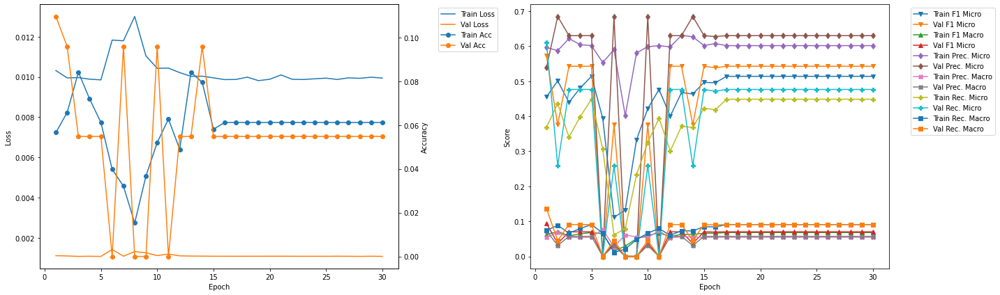

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.35
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4829 	Validation F1 Micro: 0.5076
Train F1 Marco: 0.0743 	Validation F1 Macro: 0.0653
Train Precision Mirco: 0.5944 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.073 	Validation Precision Macro: 0.0517
Train Recall Mirco: 0.4066 	Validation Recall Micro: 0.4586
Train Recall Marco: 0.0839 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.55
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.1644
Train F1 Mirco: 0.5117 	Validation F1 Micro: 0.3937
Train F1 Marco: 0.068 	Validation F1 Macro: 0.037
Train Precision Mirco: 0.6091 	Validation Precision Micro: 0.6849
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0311
Train Recall Mirco: 0.4411 

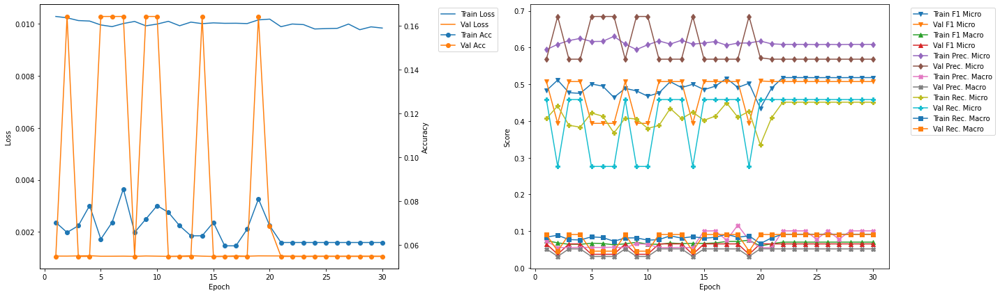

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.39
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0657 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4869 	Validation F1 Micro: 0.5655
Train F1 Marco: 0.0669 	Validation F1 Macro: 0.0711
Train Precision Mirco: 0.6059 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.1 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.4069 	Validation Recall Micro: 0.5
Train Recall Marco: 0.0827 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.6
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5121 	Validation F1 Micro: 0.5655
Train F1 Marco: 0.0694 	Validation F1 Macro: 0.0711
Train Precision Mirco: 0.5997 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.0999 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.4468 	Validatio

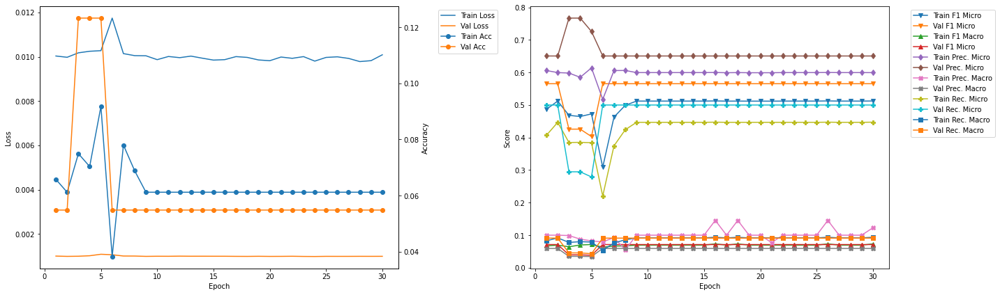

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.45
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.078 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4543 	Validation F1 Micro: 0.5569
Train F1 Marco: 0.0658 	Validation F1 Macro: 0.0707
Train Precision Mirco: 0.611 	Validation Precision Micro: 0.637
Train Precision Marco: 0.1446 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.3616 	Validation Recall Micro: 0.4947
Train Recall Marco: 0.0738 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.65
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0657 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4672 	Validation F1 Micro: 0.5569
Train F1 Marco: 0.0641 	Validation F1 Macro: 0.0707
Train Precision Mirco: 0.6041 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0991 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.3809 	Va

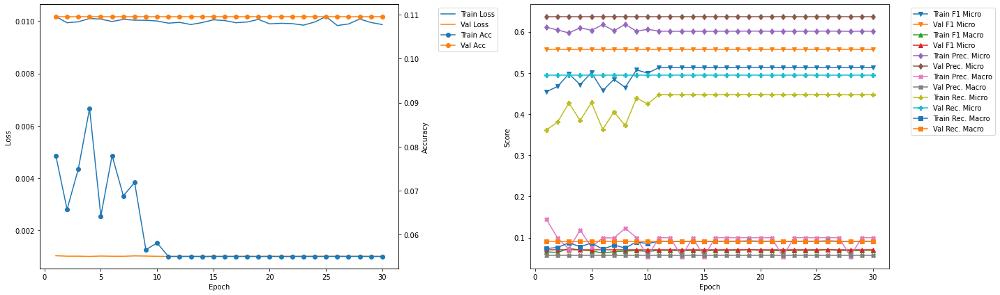

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.5
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4656 	Validation F1 Micro: 0.5303
Train F1 Marco: 0.0639 	Validation F1 Macro: 0.0702
Train Precision Mirco: 0.6166 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.1001 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.374 	Validation Recall Micro: 0.4577
Train Recall Marco: 0.0742 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.7
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4968 	Validation F1 Micro: 0.5303
Train F1 Marco: 0.0677 	Validation F1 Macro: 0.0702
Train Precision Mirco: 0.6071 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.1001 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.4204 	V

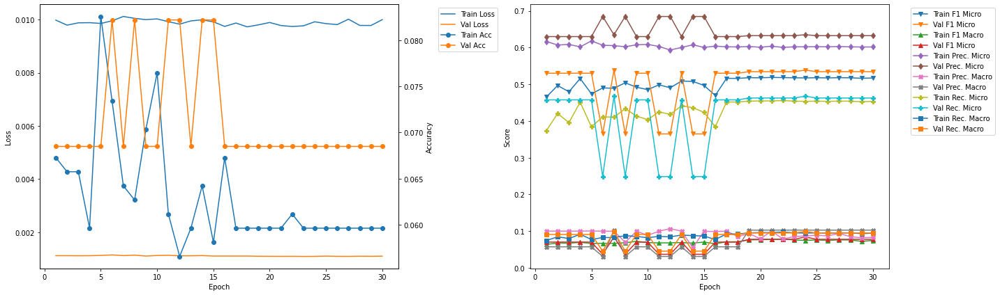

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 36.55
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.513 	Validation F1 Micro: 0.5176
Train F1 Marco: 0.0706 	Validation F1 Macro: 0.0838
Train Precision Mirco: 0.6065 	Validation Precision Micro: 0.5946
Train Precision Marco: 0.0853 	Validation Precision Macro: 0.099
Train Recall Mirco: 0.4444 	Validation Recall Micro: 0.4583
Train Recall Marco: 0.0904 	Validation Recall Macro: 0.101

Epoch 2 	Learning Rate: 0.01 	Time (min): 36.75
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.055 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5107 	Validation F1 Micro: 0.5176
Train F1 Marco: 0.0714 	Validation F1 Macro: 0.0838
Train Precision Mirco: 0.6022 	Validation Precision Micro: 0.5946
Train Precision Marco: 0.0699 	Validation Precision Macro: 0.099
Train Recall Mirco: 0.4433 	Valid

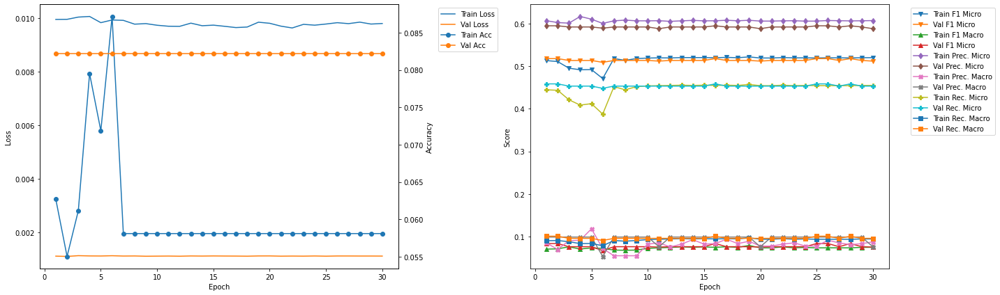

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.6
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0779 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4776 	Validation F1 Micro: 0.5115
Train F1 Marco: 0.0762 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6115 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.1066 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.3919 	Validation Recall Micro: 0.4363
Train Recall Marco: 0.0825 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.8
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0702 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4841 	Validation F1 Micro: 0.5115
Train F1 Marco: 0.0706 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6174 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0836 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.3982 	

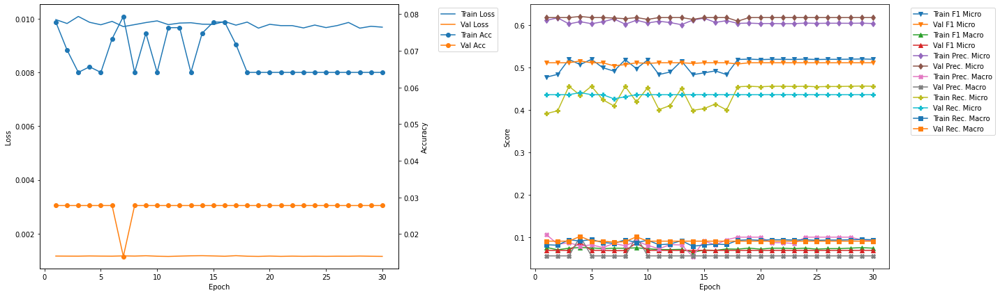

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 48.64
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0748 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.503 	Validation F1 Micro: 0.485
Train F1 Marco: 0.0746 	Validation F1 Macro: 0.0654
Train Precision Mirco: 0.6207 	Validation Precision Micro: 0.5625
Train Precision Marco: 0.0804 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4229 	Validation Recall Micro: 0.4263
Train Recall Marco: 0.0876 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 48.84
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5008 	Validation F1 Micro: 0.485
Train F1 Marco: 0.0702 	Validation F1 Macro: 0.0654
Train Precision Mirco: 0.6129 	Validation Precision Micro: 0.5625
Train Precision Marco: 0.1006 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4234 	V

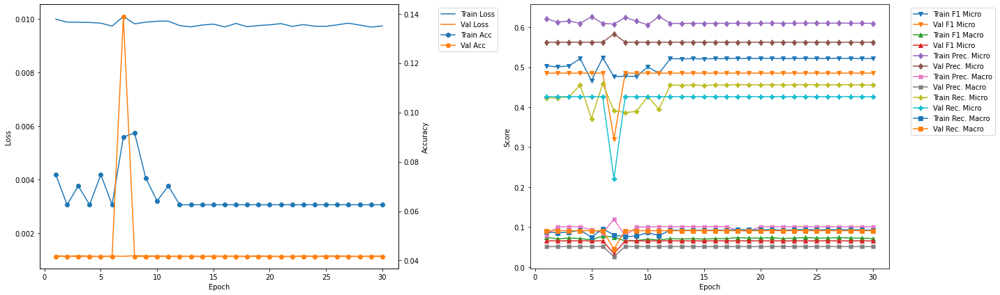

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 54.69
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0702 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.5014 	Validation F1 Micro: 0.3251
Train F1 Marco: 0.0716 	Validation F1 Macro: 0.0354
Train Precision Mirco: 0.6086 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.0851 	Validation Precision Macro: 0.029
Train Recall Mirco: 0.4263 	Validation Recall Micro: 0.218
Train Recall Marco: 0.0869 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 54.89
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.1115 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4275 	Validation F1 Micro: 0.507
Train F1 Marco: 0.0604 	Validation F1 Macro: 0.0699
Train Precision Mirco: 0.6335 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0996 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.3226 

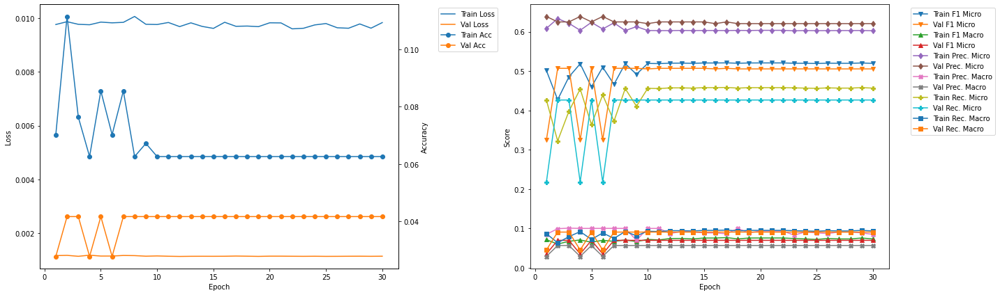

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 2 	Epoch: 1
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4554 	Validation F1 Micro: 0.5728
Train F1 Marco: 0.0622 	Validation F1 Macro: 0.094
Train Precision Mirco: 0.5965 	Validation Precision Micro: 0.5388
Train Precision Marco: 0.0538 	Validation Precision Macro: 0.0735
Train Recall Mirco: 0.3683 	Validation Recall Micro: 0.6114
Train Recall Marco: 0.0739 	Validation Recall Macro: 0.1364


In [27]:
vgg16bnLSTM_500_1_50_best = Kfold_train_CNN_RNN(model = vgg16bnLSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg16bnLSTM_500_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.21
Train Loss: 0.0169 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0044 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0084 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0526 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0407 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0023 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0056 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.42
Train Loss: 0.0127 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0034 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0018 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.15 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1364 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0017 	Validation Recall Micro: 0.0
Train Recall 

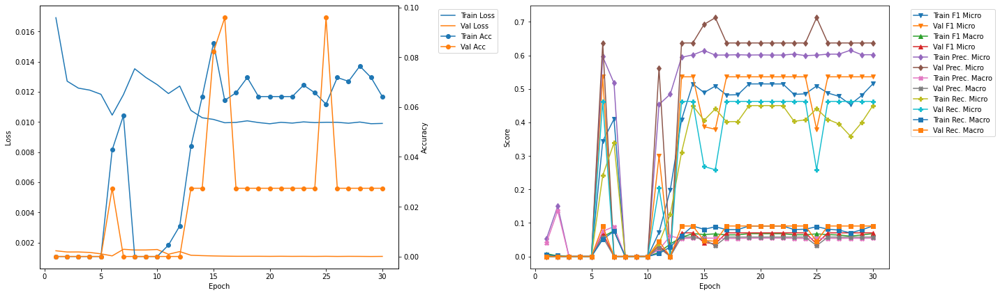

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 6.5
Train Loss: 0.0119 	Validation Loss: 0.0011
Train Accuracy: 0.0336 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.2504 	Validation F1 Micro: 0.5254
Train F1 Marco: 0.0484 	Validation F1 Macro: 0.0707
Train Precision Mirco: 0.4692 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0657 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.1708 	Validation Recall Micro: 0.4471
Train Recall Marco: 0.0402 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.71
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0657 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4719 	Validation F1 Micro: 0.5254
Train F1 Marco: 0.0669 	Validation F1 Macro: 0.0707
Train Precision Mirco: 0.5961 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0661 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.3905 	Val

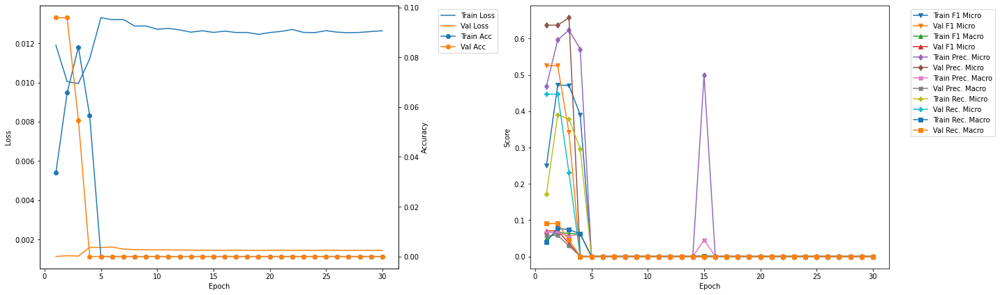

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.78
Train Loss: 0.0137 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.98
Train Loss: 0.0134 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall

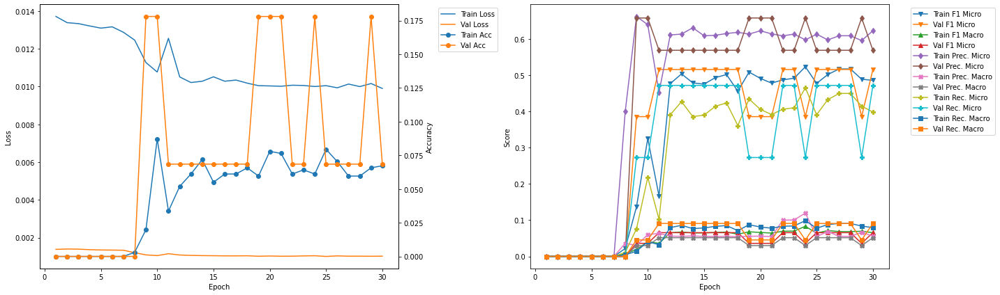

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.05
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.081 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4935 	Validation F1 Micro: 0.5104
Train F1 Marco: 0.0663 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.6209 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0558 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4095 	Validation Recall Micro: 0.4503
Train Recall Marco: 0.0815 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.26
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4939 	Validation F1 Micro: 0.5104
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.606 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4169 	Va

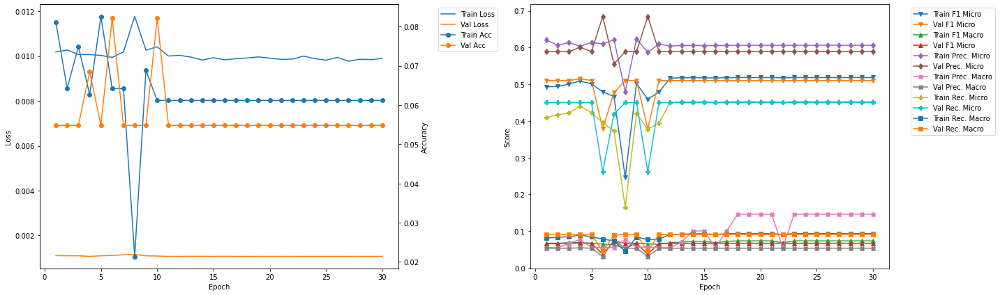

-------------------------------------------
FOLD 5
-------------------------------------------
Validation F1 Micro Score Increased (0.536023 --> 0.550898).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 25.35
Train Loss: 0.0104 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4266 	Validation F1 Micro: 0.5509
Train F1 Marco: 0.0584 	Validation F1 Macro: 0.0703
Train Precision Mirco: 0.5859 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.053 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.3354 	Validation Recall Micro: 0.4894
Train Recall Marco: 0.066 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.56
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4948 	Validation F1 Micro: 0.3678
Train F1 Marco: 0.0663 	Validation F1 Macro: 0.0361
Train Precision Mirco: 0.6088 	Validation Precision Micro: 0.6575
Train Precisio

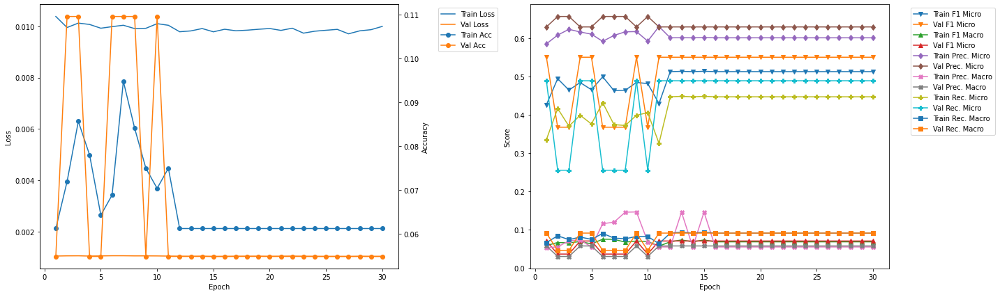

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 31.62
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0963 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4453 	Validation F1 Micro: 0.4824
Train F1 Marco: 0.0701 	Validation F1 Macro: 0.0652
Train Precision Mirco: 0.618 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0908 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.348 	Validation Recall Micro: 0.4227
Train Recall Marco: 0.0713 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 31.83
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5023 	Validation F1 Micro: 0.3371
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0347
Train Precision Mirco: 0.6094 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.055 	Validation Precision Macro: 0.028
Train Recall Mirco: 0.4273 	

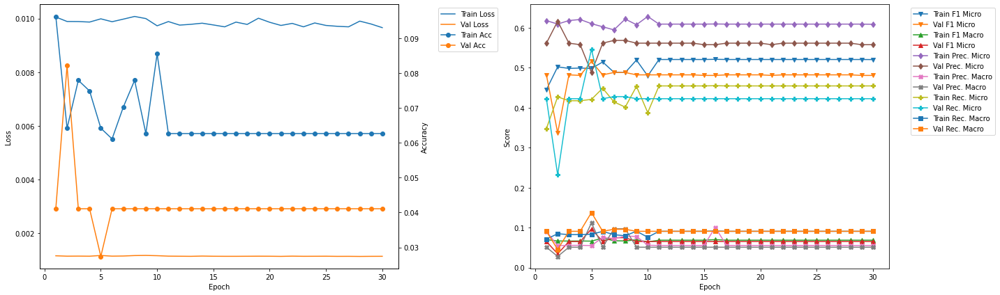

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 37.9
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5066 	Validation F1 Micro: 0.3566
Train F1 Marco: 0.0707 	Validation F1 Macro: 0.0351
Train Precision Mirco: 0.6093 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0753 	Validation Precision Macro: 0.0286
Train Recall Mirco: 0.4336 	Validation Recall Micro: 0.2486
Train Recall Marco: 0.0875 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.1
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4976 	Validation F1 Micro: 0.5076
Train F1 Marco: 0.0665 	Validation F1 Macro: 0.0663
Train Precision Mirco: 0.6118 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4194

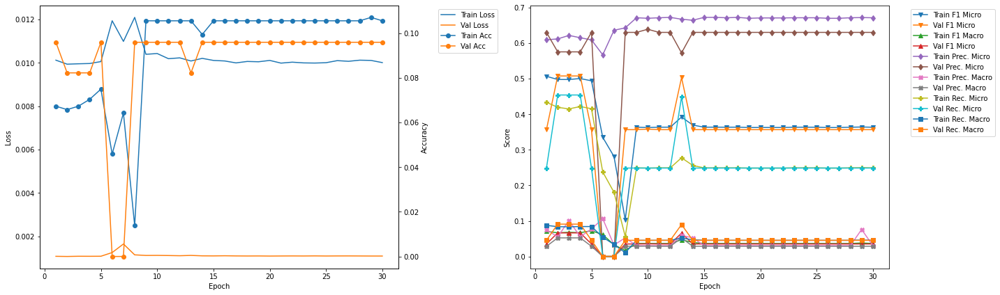

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 44.17
Train Loss: 0.0111 	Validation Loss: 0.0011
Train Accuracy: 0.084 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.2941 	Validation F1 Micro: 0.522
Train F1 Marco: 0.0366 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.6206 	Validation Precision Micro: 0.6224
Train Precision Marco: 0.0345 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.1927 	Validation Recall Micro: 0.4495
Train Recall Marco: 0.0392 	Validation Recall Macro: 0.0889

Epoch 2 	Learning Rate: 0.01 	Time (min): 44.38
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0733 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4614 	Validation F1 Micro: 0.531
Train F1 Marco: 0.0619 	Validation F1 Macro: 0.0704
Train Precision Mirco: 0.6113 	Validation Precision Micro: 0.6383
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.0584
Train Recall Mirco: 0.3705 

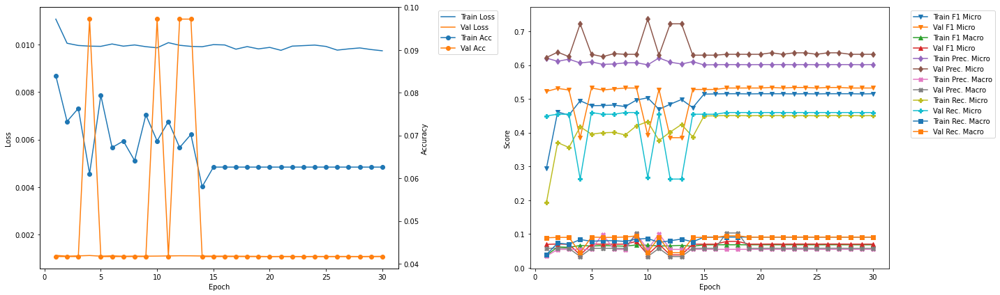

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 50.44
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0794 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4487 	Validation F1 Micro: 0.5042
Train F1 Marco: 0.0622 	Validation F1 Macro: 0.0699
Train Precision Mirco: 0.6193 	Validation Precision Micro: 0.625
Train Precision Marco: 0.1006 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.3518 	Validation Recall Micro: 0.4225
Train Recall Marco: 0.0692 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 50.65
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0641 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5072 	Validation F1 Micro: 0.4843
Train F1 Marco: 0.0669 	Validation F1 Macro: 0.0677
Train Precision Mirco: 0.6017 	Validation Precision Micro: 0.6159
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0559
Train Recall Mirco: 0.438

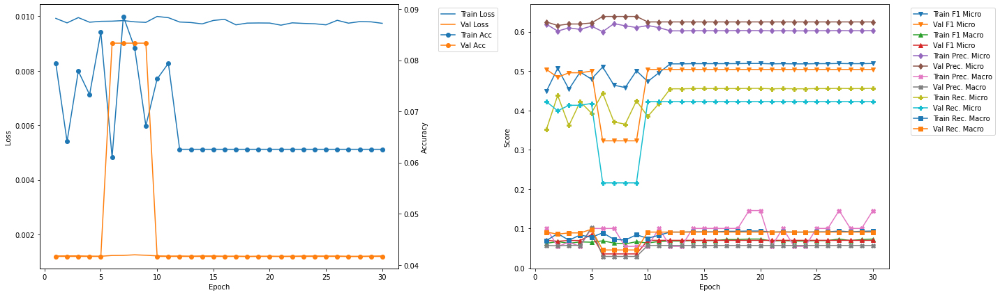

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 56.71
Train Loss: 0.0128 	Validation Loss: 0.0012
Train Accuracy: 0.0183 	Validation Accuracy: 0.1667
Train F1 Mirco: 0.1349 	Validation F1 Micro: 0.3759
Train F1 Marco: 0.0371 	Validation F1 Macro: 0.0595
Train Precision Mirco: 0.378 	Validation Precision Micro: 0.6849
Train Precision Marco: 0.1205 	Validation Precision Macro: 0.0764
Train Recall Mirco: 0.0821 	Validation Recall Micro: 0.2591
Train Recall Marco: 0.0296 	Validation Recall Macro: 0.0606

Epoch 2 	Learning Rate: 0.01 	Time (min): 56.92
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0641 	Validation Accuracy: 0.0
Train F1 Mirco: 0.4653 	Validation F1 Micro: 0.0103
Train F1 Marco: 0.064 	Validation F1 Macro: 0.0227
Train Precision Mirco: 0.6094 	Validation Precision Micro: 1.0
Train Precision Marco: 0.0998 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.3763 	Val

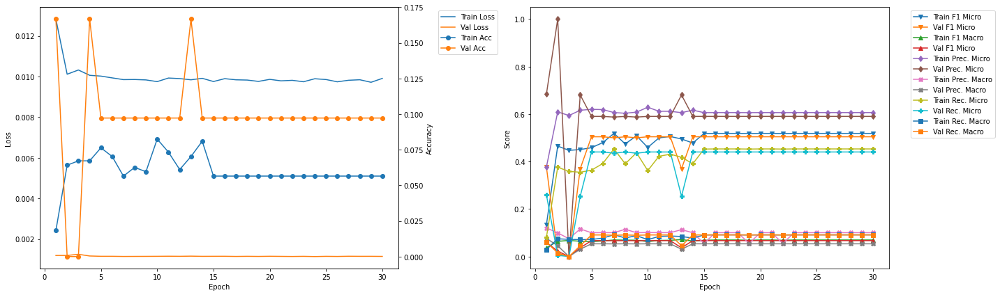

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 5 	Epoch: 1
Train Loss: 0.0104 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4266 	Validation F1 Micro: 0.5509
Train F1 Marco: 0.0584 	Validation F1 Macro: 0.0703
Train Precision Mirco: 0.5859 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.053 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.3354 	Validation Recall Micro: 0.4894
Train Recall Marco: 0.066 	Validation Recall Macro: 0.0909


In [28]:
vgg19bnLSTM_500_1_50_best = Kfold_train_CNN_RNN(model = vgg19bnLSTM_500_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg19bnLSTM_500_1_50')

In [29]:
print('Total Training Time (HR:M:S): ' + str(datetime.timedelta(hours = ((time.time() - START) / 60 / 60))).rsplit('.', 1)[0])

Total Training Time (HR:M:S): 7:27:01


## Training Summary

### Summary Table

In [30]:
summaryDF = pd.DataFrame({
    'ResNet18' : resnet18LSTM_500_1_50_best,
    'ResNet50' : resnet50LSTM_500_1_50_best,
    'ResNet101' : resnet101LSTM_500_1_50_best,
    'DenseNet121' : densenet121LSTM_500_1_50_best,
    'DenseNet169' : densenet169LSTM_500_1_50_best,
    'DenseNet201' : densenet201LSTM_500_1_50_best,
    'VGG11_BN' : vgg11bnLSTM_500_1_50_best,
    'VGG16_BN' : vgg16bnLSTM_500_1_50_best,
    'VGG19_BN' : vgg19bnLSTM_500_1_50_best
})
summaryDF.index = ['Fold', 'Epoch', 'Train Loss', 'Train Accuracy', 'Train F1 Micro', 'Train F1 Macro', 'Train Precision Micro', 'Train Precision Macro', 'Train Recall Micro', 'Train Recall Macro',
                   'Val Loss', 'Val Accuracy', 'Val F1 Micro', 'Val F1 Macro', 'Val Precision Micro', 'Val Precision Macro', 'Val Recall Micro', 'Val Recall Macro']

summaryDF

,ResNet18,ResNet50,ResNet101,DenseNet121,DenseNet169,DenseNet201,VGG11_BN,VGG16_BN,VGG19_BN
Fold,10.000000,8.000000,8.000000,8.000000,4.000000,7.000000,1.000000,2.000000,5.000000
Epoch,1.000000,1.000000,1.000000,15.000000,1.000000,1.000000,23.000000,1.000000,1.000000
Train Loss,0.010142,0.010160,0.010139,0.010031,0.010107,0.010027,0.010010,0.010319,0.010382
Train Accuracy,0.073282,0.059542,0.059542,0.068702,0.073394,0.076453,0.048930,0.056575,0.061162
Train F1 Micro,0.472512,0.479017,0.500000,0.478426,0.471197,0.482782,0.492995,0.455411,0.426609
Train F1 Macro,0.067346,0.064648,0.066749,0.064233,0.066656,0.064788,0.069822,0.062236,0.058353
Train Precision Micro,0.614480,0.605172,0.598413,0.610573,0.602824,0.598478,0.597896,0.596491,0.585899
Train Precision Macro,0.076856,0.054261,0.054172,0.054518,0.072366,0.053806,0.074554,0.053763,0.052964
Train Recall Micro,0.383833,0.396386,0.429385,0.393303,0.386750,0.404571,0.419410,0.368301,0.335418
Train Recall Macro,0.077657,0.079995,0.087154,0.078254,0.078420,0.081407,0.085617,0.073933,0.065971


### Training Summary Graph

In [31]:
import plotly
import plotly.graph_objects as go

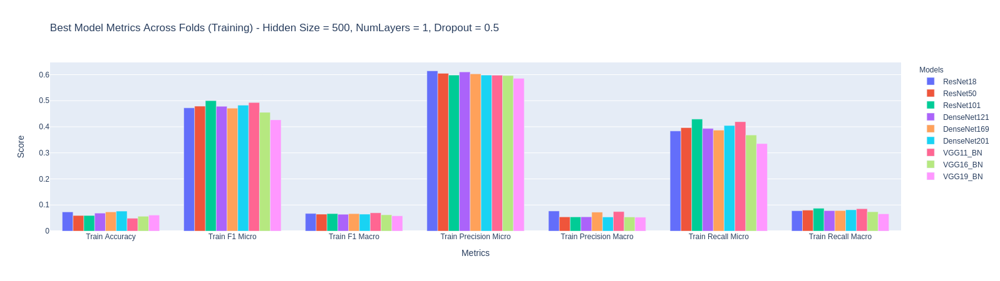

In [34]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[3:10], y = summaryDF['ResNet18'][3:10]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[3:10], y = summaryDF['ResNet50'][3:10]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[3:10], y = summaryDF['ResNet101'][3:10]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[3:10], y = summaryDF['DenseNet121'][3:10]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[3:10], y = summaryDF['DenseNet169'][3:10]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[3:10], y = summaryDF['DenseNet201'][3:10]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[3:10], y = summaryDF['VGG11_BN'][3:10]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[3:10], y = summaryDF['VGG16_BN'][3:10]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[3:10], y = summaryDF['VGG19_BN'][3:10]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Training) - Hidden Size = 500, NumLayers = 1, Dropout = 0.5',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()

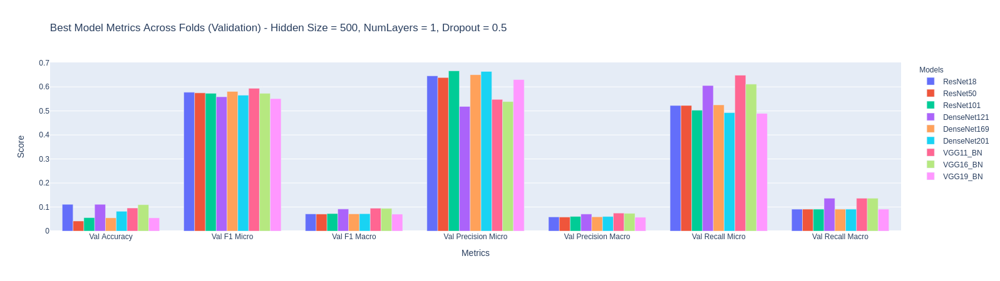

In [35]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[11:], y = summaryDF['ResNet18'][11:]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[11:], y = summaryDF['ResNet50'][11:]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[11:], y = summaryDF['ResNet101'][11:]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[11:], y = summaryDF['DenseNet121'][11:]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[11:], y = summaryDF['DenseNet169'][11:]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[11:], y = summaryDF['DenseNet201'][11:]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[11:], y = summaryDF['VGG11_BN'][11:]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[11:], y = summaryDF['VGG16_BN'][11:]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[11:], y = summaryDF['VGG19_BN'][11:]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Validation) - Hidden Size = 500, NumLayers = 1, Dropout = 0.5',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()